# styleTransfer.py

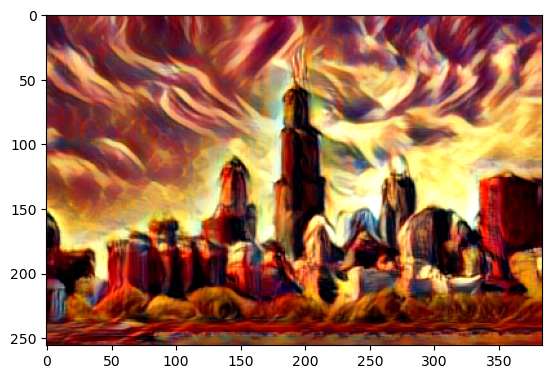

In [10]:
# Type 1: Linear Style Transfer (content, style)

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

content_fn = "data/content/chicago.png"
content_im = utils.loadImage(content_fn, asTensor=True)

style_fn = "data/style/27.jpg"
style_im = utils.loadImage(style_fn, asTensor=True)

save_fn = "output_chicago.png"

output = styleTransfer.styletransfer(content_im,style_im)

result = utils.tensorToImage(output)
# result = np.clip(result,0,1)

plt.imshow(result)
plt.show()

plt.imsave(save_fn,result)

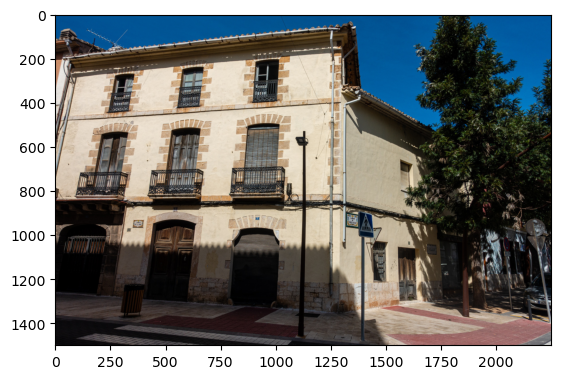

77


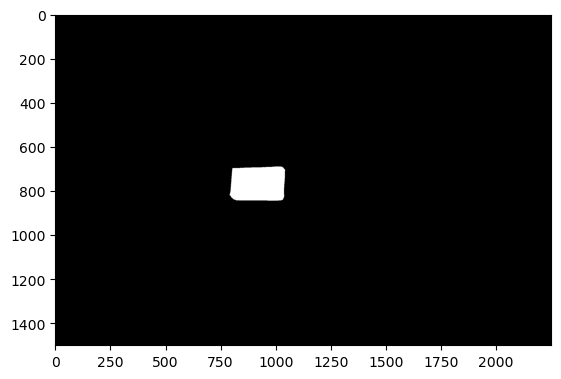

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


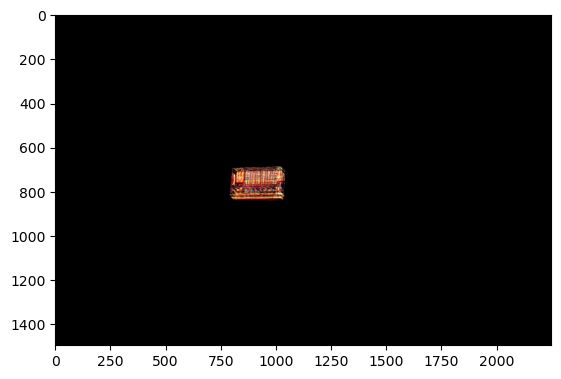

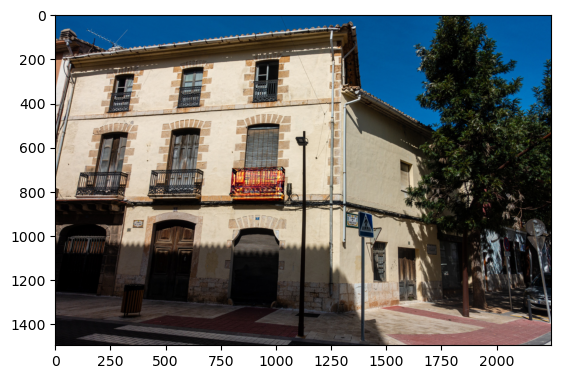

In [11]:
# Type 2: Linear Style Transfer (content, style, mask) (Regular) Mask_Window

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)


f = open('sa_246173.json',)
data = json.load(f)
#print(data)

im = plt.imread("sa_246173.jpg")

plt.imshow(im)
plt.show()

mask = mask_utils.decode(data["annotations"][7]["segmentation"])

#Number of masks
print(len(data["annotations"]))

plt.imshow(mask,cmap="gray")
plt.show()

# Create an alpha channel from the inverted mask
alpha_channel = mask.astype(float)
print(np.amax(alpha_channel))

im_f = im/255
print(np.amax(im_f))

content_im = utils.imageToTensor(im)

style_fn = "data/style/27.jpg"
style_im = Image.open(style_fn).convert('RGB')
style_im = utils.toTensor(style_im).unsqueeze(0)

# Ensure the tensors are correct
print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

mask_im = utils.maskToTensor(mask)

output = styleTransfer.style_then_mask(content_im,style_im,mask_im)

# Ensure the output has the correct shape before converting
print(f"output type: {type(output)}, shape: {output.shape}")

result = utils.toNumpy(output)
result = np.clip(result,0,1)

plt.imshow(result)
plt.show()

final = utils.alphaBlend(result,mask,im_f)

plt.imshow(final)
plt.show()


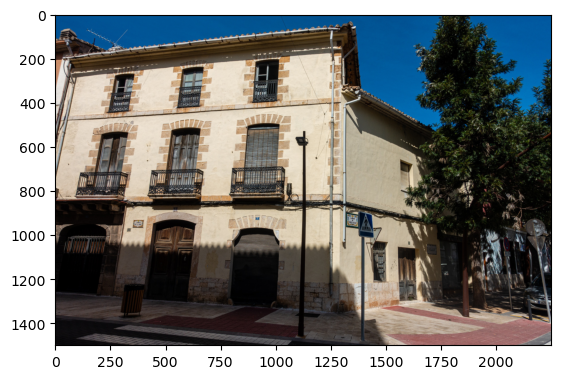

77


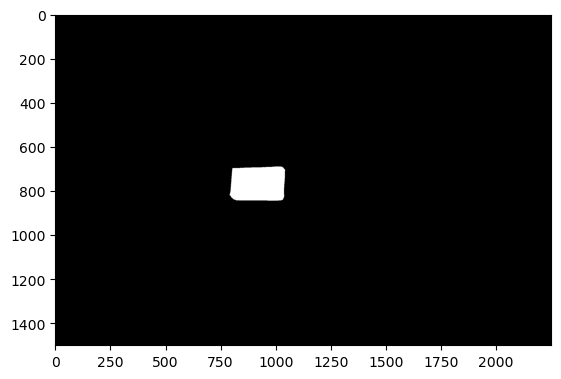

1.0
1.0
(1500, 2250, 1)
1.0


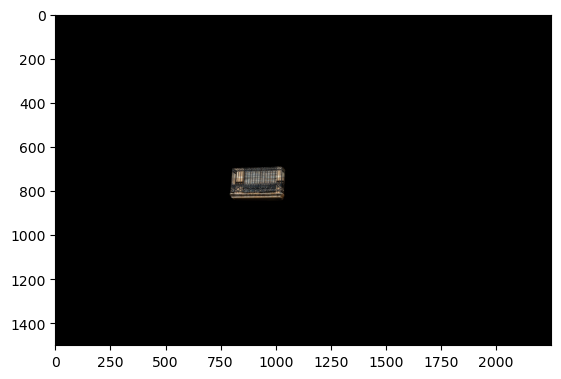

content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


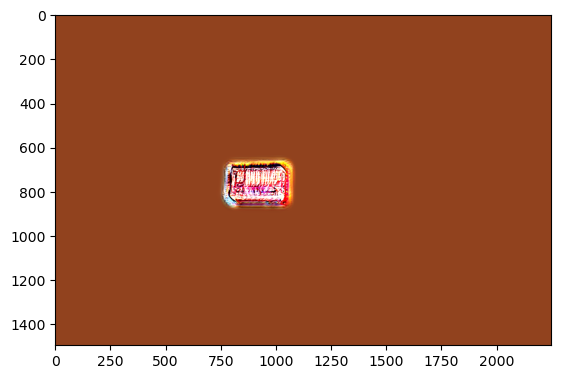

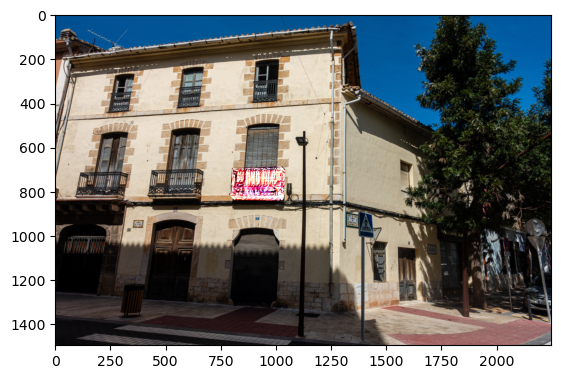

In [12]:
# Type 3: Linear Style Transfer (content, mask, style) (Regular) Mask_Window

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)


f = open('sa_246173.json',)
data = json.load(f)
#print(data)

im = plt.imread("sa_246173.jpg")

plt.imshow(im)
plt.show()

mask = mask_utils.decode(data["annotations"][7]["segmentation"])

#Number of masks
print(len(data["annotations"]))

plt.imshow(mask,cmap="gray")
plt.show()

# Create an alpha channel from the inverted mask
alpha_channel = mask.astype(float)
print(np.amax(alpha_channel))

im_f = im/255
print(np.amax(im_f))

# Create a black background
black_background = np.zeros_like(im)

print(alpha_channel[...,None].shape)

# Alpha blend the image with the black background
#blended_image = (im_f * alpha_channel[...,None] + black_background * (1 - alpha_channel[...,None]))
blended_image = utils.alphaBlend(im_f,alpha_channel,black_background)

print(np.amax(blended_image))

#Display the blended image
plt.imshow(blended_image)
plt.show()

content_im = utils.imageToTensor(im)

style_fn = "data/style/27.jpg"
style_im = Image.open(style_fn).convert('RGB')
style_im = utils.toTensor(style_im).unsqueeze(0)

# Ensure the tensors are correct
print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

mask_im = utils.maskToTensor(mask)

output = styleTransfer.mask_then_style(content_im,style_im,mask_im)

# Ensure the output has the correct shape before converting
print(f"output type: {type(output)}, shape: {output.shape}")

result = utils.toNumpy(output)
result = np.clip(result,0,1)

plt.imshow(result)
plt.show()

final = utils.alphaBlend(result,mask,im_f)

plt.imshow(final)
plt.show()

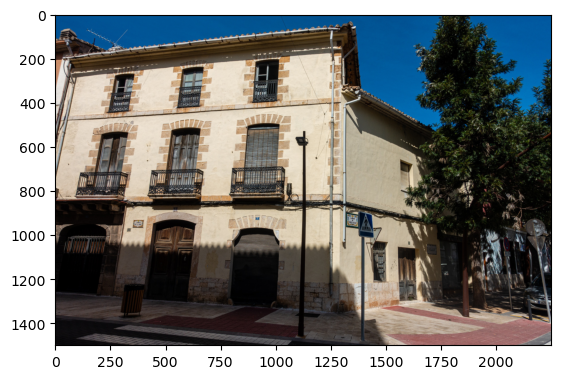

77


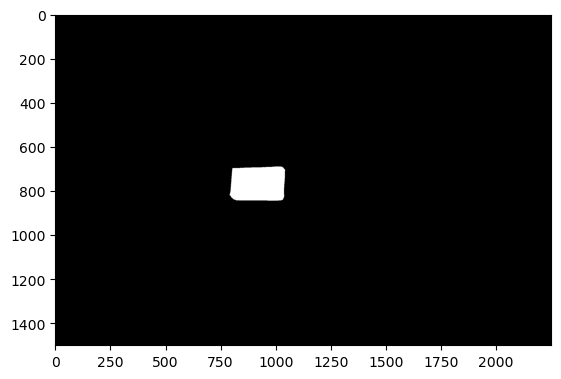

1.0
1.0
(1500, 2250, 1)
1.0


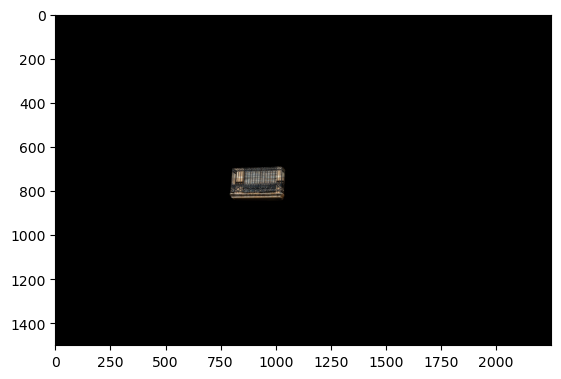

content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


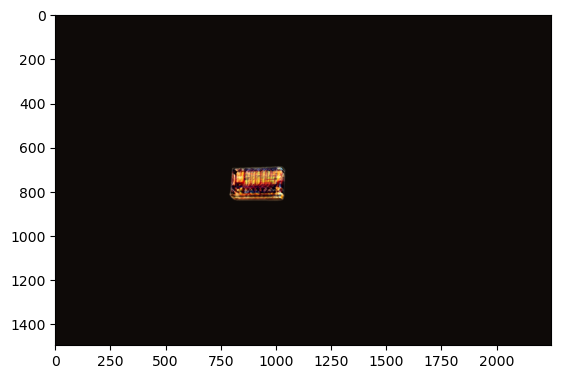

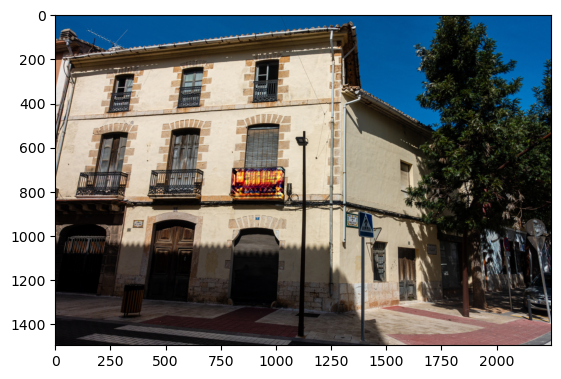

In [240]:
# Type 3: Linear Style Transfer (content, style, mask)(Partial convolution) Mask_Window

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)


f = open('sa_246173.json',)
data = json.load(f)
#print(data)

im = plt.imread("sa_246173.jpg")

plt.imshow(im)
plt.show()

mask = mask_utils.decode(data["annotations"][7]["segmentation"])

#Number of masks
print(len(data["annotations"]))

plt.imshow(mask,cmap="gray")
plt.show()

# Create an alpha channel from the inverted mask
alpha_channel = mask.astype(float)
print(np.amax(alpha_channel))

im_f = im/255
print(np.amax(im_f))

# Create a black background
black_background = np.zeros_like(im)

print(alpha_channel[...,None].shape)

# Alpha blend the image with the black background
#blended_image = (im_f * alpha_channel[...,None] + black_background * (1 - alpha_channel[...,None]))
blended_image = utils.alphaBlend(im_f,alpha_channel,black_background)

print(np.amax(blended_image))

#Display the blended image
plt.imshow(blended_image)
plt.show()

content_im = utils.imageToTensor(im)

style_fn = "data/style/27.jpg"
style_im = Image.open(style_fn).convert('RGB')
style_im = utils.toTensor(style_im).unsqueeze(0)

# Ensure the tensors are correct
print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

mask_im = utils.maskToTensor(mask)

output = styleTransfer.style_with_partialConv(content_im,style_im,mask_im)

# Ensure the output has the correct shape before converting
print(f"output type: {type(output)}, shape: {output.shape}")

result = utils.toNumpy(output)
result = np.clip(result,0,1)

plt.imshow(result)
plt.show()

final = utils.alphaBlend(result,mask,im_f)

plt.imshow(final)
plt.show()

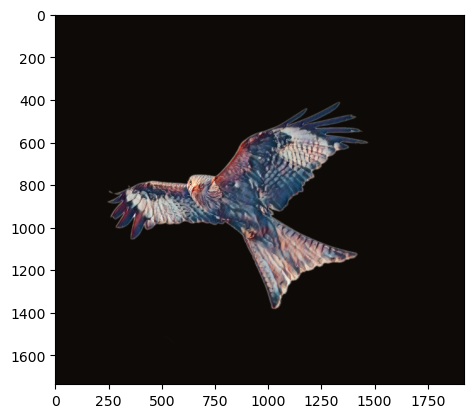

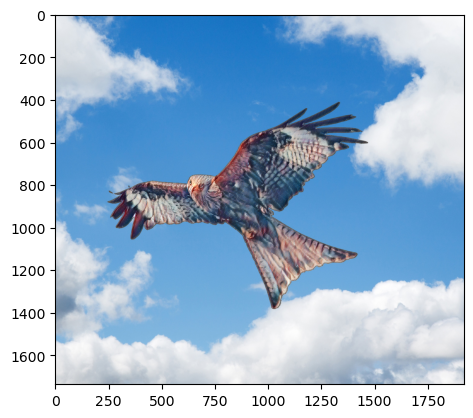

In [236]:
# Type 4: Linear Style Transfer (content, style, mask)(Partial convolution) Mask_bird (4 types included)

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
from libs.Matrix_masked import MulLayer
from libs.models_masked import encoder4, decoder4

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)


content_fn = "data/content/FlyingBird.jpg"
content_im = utils.loadImage(content_fn,asTensor=True)

masked_fn = "data/content/FlyingBird_mask.jpg"
masked_im = utils.loadMask(masked_fn,asTensor=True)
#masked_im = masked_im.to(dtype=torch.float32)   # Convert to torch tensor with dtype=torch.float32
# masked_im = torch.tensor(masked_im, dtype=torch.float32)
# masked_im = None

style_fn = "data/style/antimonocromatismo.jpg"
style_im = utils.loadImage(style_fn,asTensor=True)

save_fn = "output_masked.png"

#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# #4 types of styleTransfer:
#result = styleTransfer.styletransfer(content_im,style_im)
#result = styleTransfer.style_then_mask(content_im,style_im,masked_im)
#result = styleTransfer.mask_then_style(content_im,masked_im,style_im)
result = styleTransfer.style_with_partialConv(content_im,style_im,masked_im)
    
    

result = utils.toNumpy(result)
result = np.clip(result,0,1)

plt.imshow(result)
plt.show()

final = utils.alphaBlend(result,utils.loadMask(masked_fn)/255,utils.loadImage(content_fn)/255)

plt.imshow(final)
plt.show()

plt.imsave(save_fn,result)

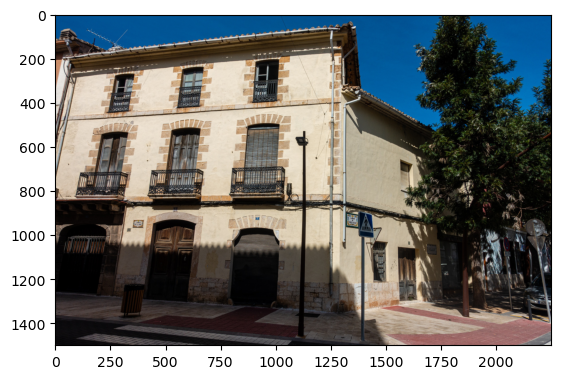

1.0


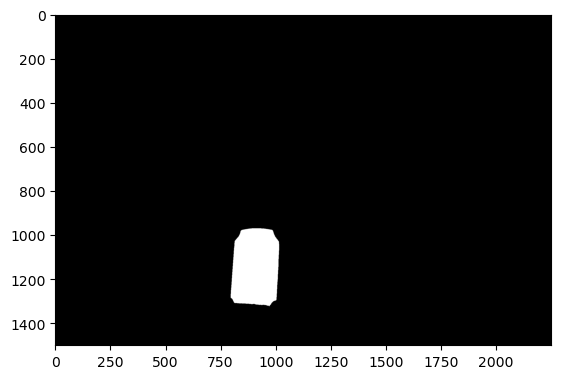

content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


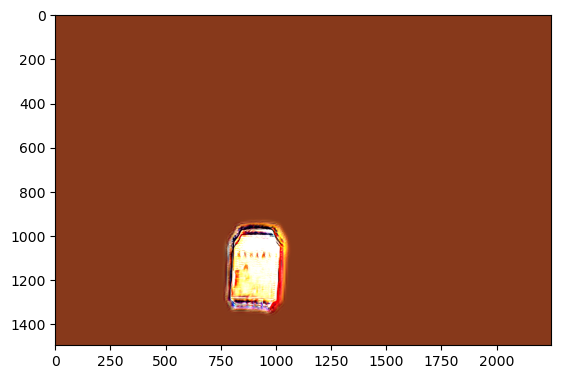

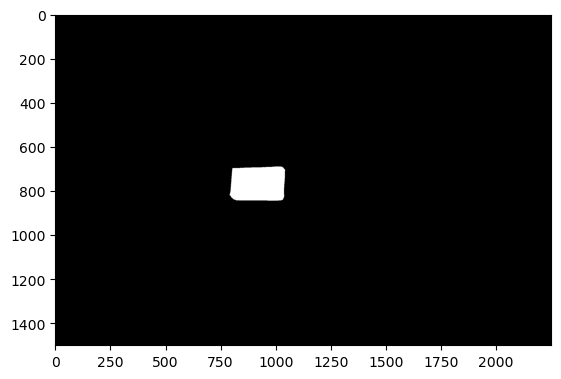

content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


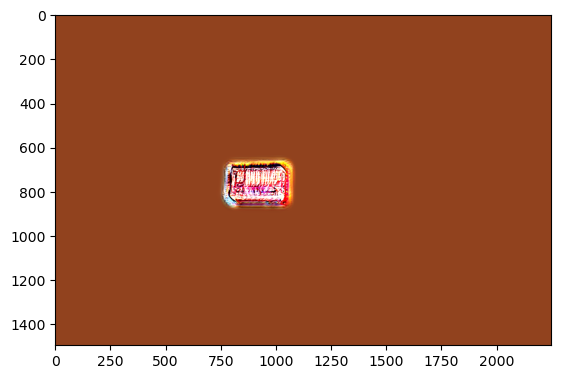

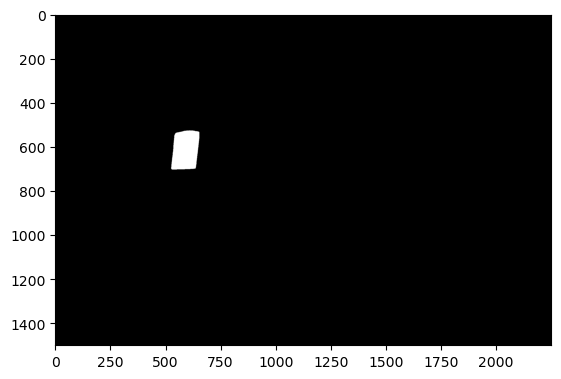

content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


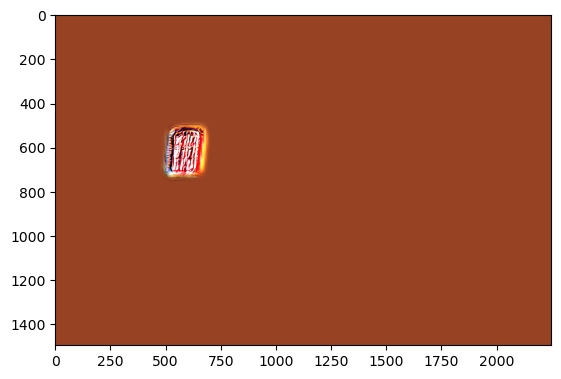

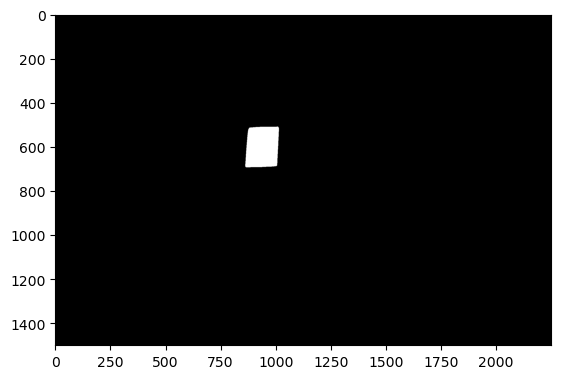

content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


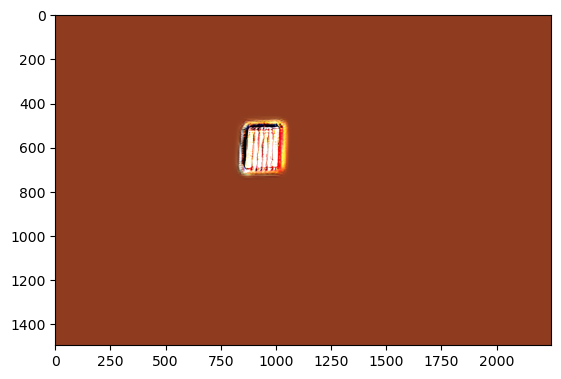

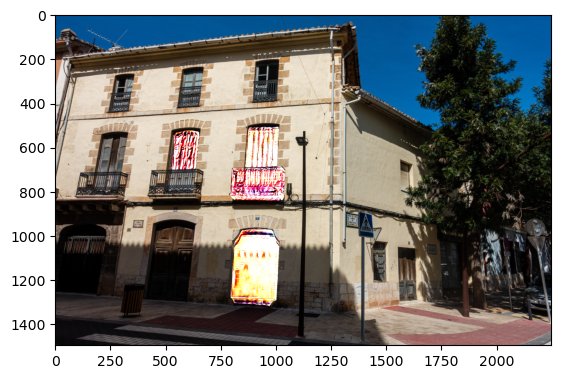

In [14]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) MultiMask_Window

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)


f = open('sa_246173.json',)
data = json.load(f)
#print(data)

im = plt.imread("sa_246173.jpg")

plt.imshow(im)
plt.show()

# Create an alpha channel from the inverted mask
im_f = im/255
print(np.amax(im_f))

content_im = utils.imageToTensor(im)

style_fn = "data/style/27.jpg"
style_im = Image.open(style_fn).convert('RGB')
style_im = utils.toTensor(style_im).unsqueeze(0)

indices = [2, 7, 8, 9]  # Example indices
for index in indices:
    
    mask = mask_utils.decode(data["annotations"][index]["segmentation"])
    alpha_channel = mask.astype(float)
    plt.imshow(mask,cmap="gray")
    plt.show()

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    mask_im = utils.maskToTensor(mask)

    output = styleTransfer.mask_then_style(content_im,style_im,mask_im)

    # Ensure the output has the correct shape before converting
    print(f"output type: {type(output)}, shape: {output.shape}")

    result = utils.toNumpy(output)
    result = np.clip(result,0,1)

    plt.imshow(result)
    plt.show()

    im_f = utils.alphaBlend(result,mask,im_f)

plt.imshow(im_f)
plt.show()


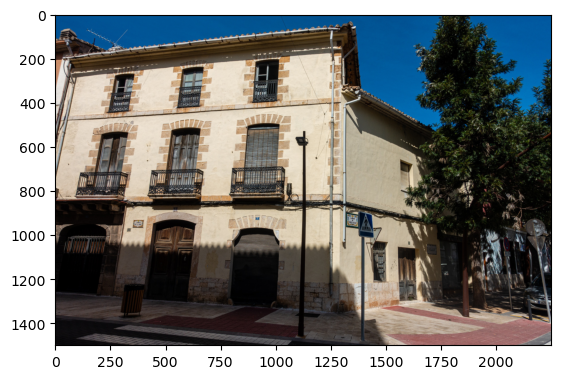

77


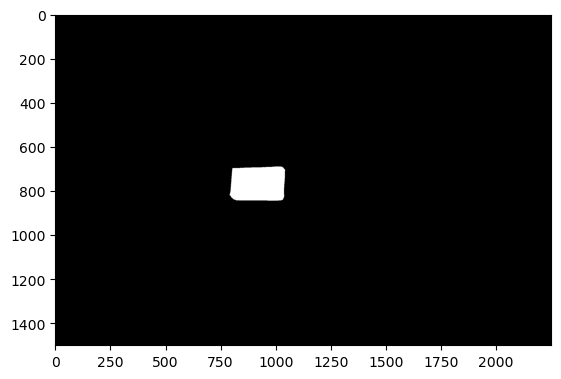

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


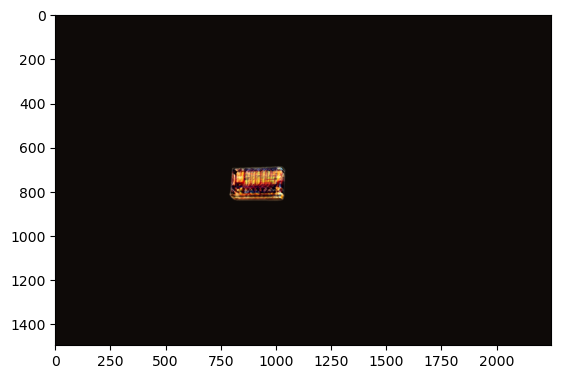

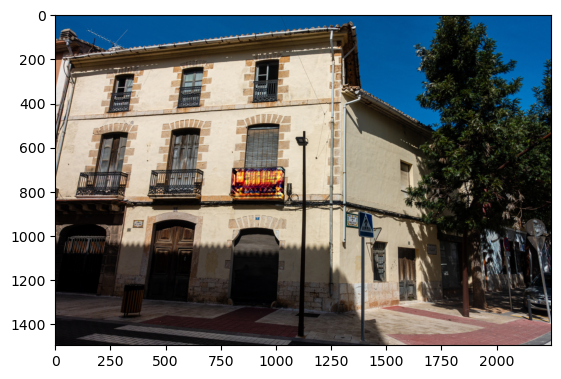

In [15]:
# Type 44: Linear Style Transfer (content, style, mask) (partialConv) Mask_Window

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor
#from libs.Matrix import MulLayer
#from libs.models import encoder4, decoder4

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)


f = open('sa_246173.json',)
data = json.load(f)
#print(data)

im = plt.imread("sa_246173.jpg")

plt.imshow(im)
plt.show()

mask = mask_utils.decode(data["annotations"][7]["segmentation"])

#Number of masks
print(len(data["annotations"]))

plt.imshow(mask,cmap="gray")
plt.show()

# Create an alpha channel from the inverted mask
alpha_channel = mask.astype(float)
print(np.amax(alpha_channel))

im_f = im/255
print(np.amax(im_f))

content_im = utils.imageToTensor(im)

style_fn = "data/style/27.jpg"
style_im = Image.open(style_fn).convert('RGB')
style_im = utils.toTensor(style_im).unsqueeze(0)

# Ensure the tensors are correct
print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

mask_im = utils.maskToTensor(mask)

output = styleTransfer.style_with_partialConv(content_im,style_im,mask_im)

# Ensure the output has the correct shape before converting
print(f"output type: {type(output)}, shape: {output.shape}")

result = utils.toNumpy(output)
result = np.clip(result,0,1)

plt.imshow(result)
plt.show()

final = utils.alphaBlend(result,mask,im_f)

plt.imshow(final)
plt.show()

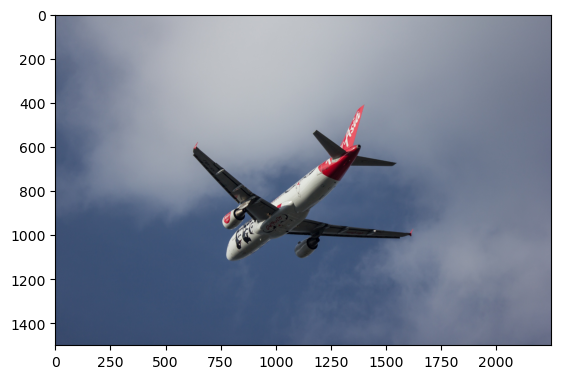

15


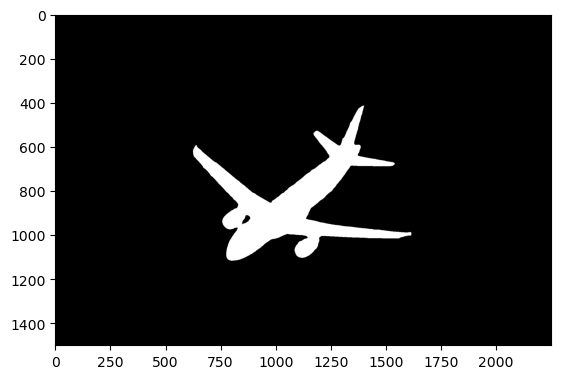

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
Shape: torch.Size([1, 1500, 2250])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


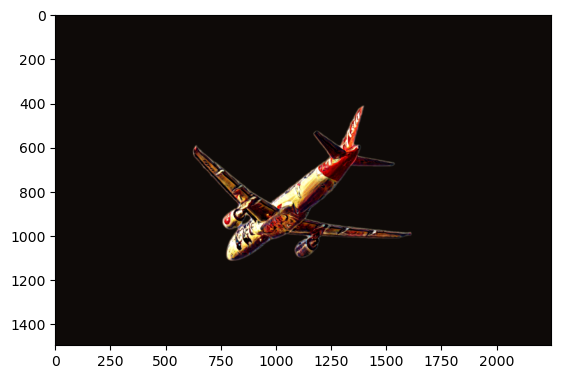

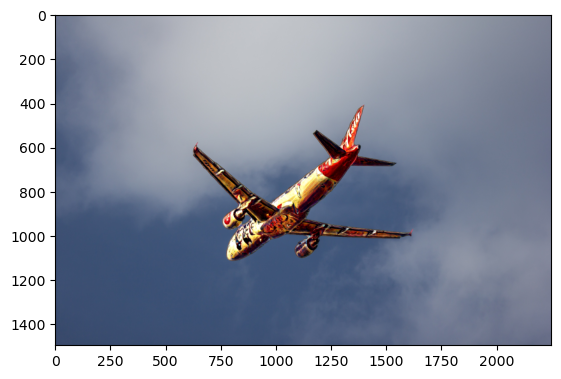

In [17]:
# Type 44: Linear Style Transfer (content, mask, style) (partialConv) Mask_airplane

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor
#from libs.Matrix import MulLayer
#from libs.models import encoder4, decoder4

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import importlib
importlib.reload(selectMasks)



f = open('sa_235049.json',)
data = json.load(f)
#print(data)

im = plt.imread("sa_235049.jpg")

plt.imshow(im)
plt.show()

mask = mask_utils.decode(data["annotations"][0]["segmentation"])

# # Compare to selectMasks.py:
# masks = selectMasks.loadIndices(data, [0], asTensor=False)
# mask = masks[0]

#Number of masks
print(len(data["annotations"]))

plt.imshow(mask,cmap="gray")
plt.show()

# Create an alpha channel from the inverted mask
alpha_channel = mask.astype(float)
print(np.amax(alpha_channel))

im_f = im/255
print(np.amax(im_f))

content_im = utils.imageToTensor(im)

style_fn = "data/style/27.jpg"
style_im = Image.open(style_fn).convert('RGB')
style_im = utils.toTensor(style_im).unsqueeze(0)

# Ensure the tensors are correct
print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

mask_im = utils.maskToTensor(mask)

print("Shape:",mask_im.shape)

output = styleTransfer.style_with_partialConv(content_im,style_im,mask_im)

# Ensure the output has the correct shape before converting
print(f"output type: {type(output)}, shape: {output.shape}")

result = utils.toNumpy(output)
result = np.clip(result,0,1)

plt.imshow(result)
plt.show()

final = utils.alphaBlend(result,mask,im_f)

plt.imshow(final)
plt.show()

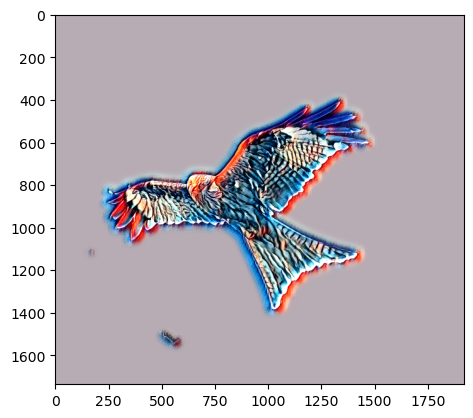

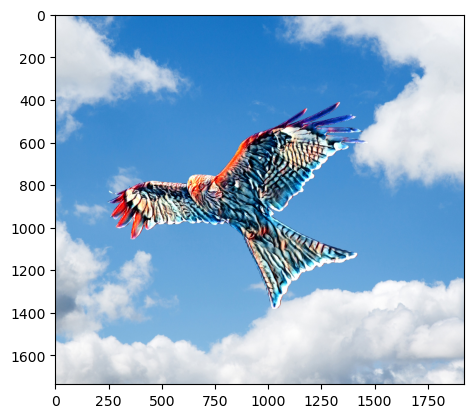

In [18]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_bird

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
from libs.Matrix_masked import MulLayer
from libs.models_masked import encoder4, decoder4

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)


content_fn = "data/content/FlyingBird.jpg"
content_im = utils.loadImage(content_fn,asTensor=True)

masked_fn = "data/content/FlyingBird_mask.jpg"
masked_im = utils.loadMask(masked_fn,asTensor=True)
#masked_im = masked_im.to(dtype=torch.float32)   # Convert to torch tensor with dtype=torch.float32
# masked_im = torch.tensor(masked_im, dtype=torch.float32)
# masked_im = None

style_fn = "data/style/antimonocromatismo.jpg"
style_im = utils.loadImage(style_fn,asTensor=True)

save_fn = "output_masked.png"

#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# #4 types of styleTransfer:
#result = styleTransfer.styletransfer(content_im,style_im)
#result = styleTransfer.style_then_mask(content_im,style_im,masked_im)
result = styleTransfer.mask_then_style(content_im,style_im,masked_im)
#result = styleTransfer.style_with_partialConv(content_im,style_im,masked_im)
    

result = utils.toNumpy(result)
result = np.clip(result,0,1)

plt.imshow(result)
plt.show()

final = utils.alphaBlend(result,utils.loadMask(masked_fn)/255,utils.loadImage(content_fn)/255)

plt.imshow(final)
plt.show()

plt.imsave(save_fn,result)

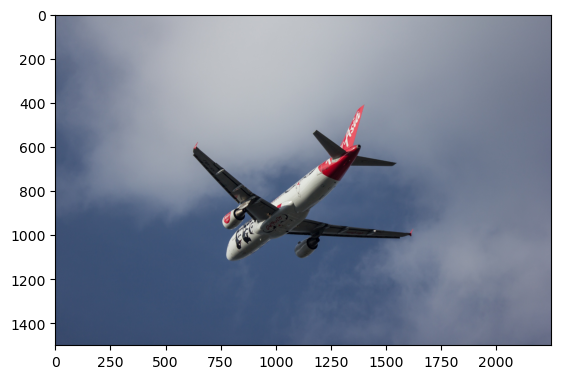

15


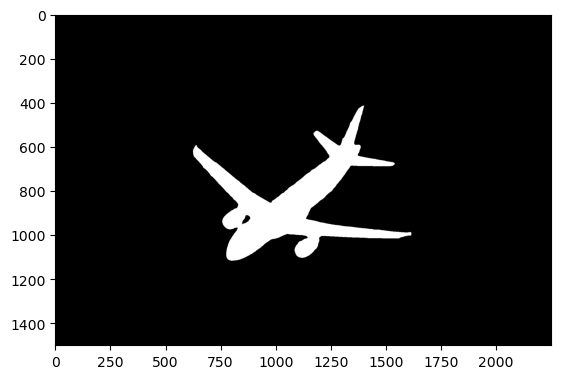

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


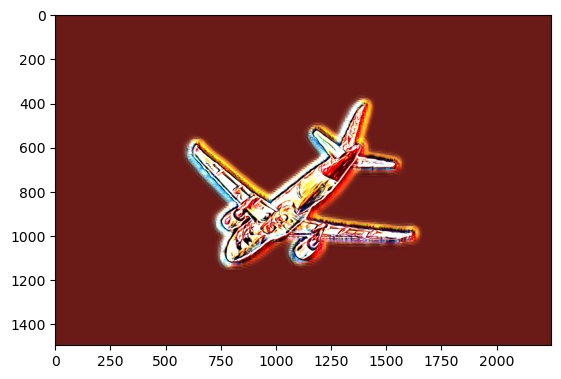

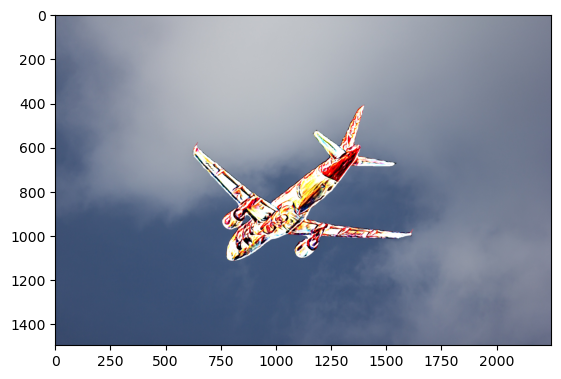

In [19]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_airplane

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)


f = open('sa_235049.json',)
data = json.load(f)
#print(data)

im = plt.imread("sa_235049.jpg")

plt.imshow(im)
plt.show()

mask = mask_utils.decode(data["annotations"][0]["segmentation"])

# # Compare to selectMasks.py:
# masks = selectMasks.loadIndices(data, [0], asTensor=False)
# mask = masks[0]

#Number of masks
print(len(data["annotations"]))

plt.imshow(mask,cmap="gray")
plt.show()

# Create an alpha channel from the inverted mask
alpha_channel = mask.astype(float)
print(np.amax(alpha_channel))

im_f = im/255
print(np.amax(im_f))

content_im = utils.imageToTensor(im)

style_fn = "data/style/27.jpg"
style_im = Image.open(style_fn).convert('RGB')
style_im = utils.toTensor(style_im).unsqueeze(0)

# Ensure the tensors are correct
print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

mask_im = utils.maskToTensor(mask)

output = styleTransfer.mask_then_style(content_im,style_im,mask_im)

# Ensure the output has the correct shape before converting
print(f"output type: {type(output)}, shape: {output.shape}")

result = utils.toNumpy(output)
result = np.clip(result,0,1)

plt.imshow(result)
plt.show()

final = utils.alphaBlend(result,mask,im_f)

plt.imshow(final)
plt.show()

# selectMask.py

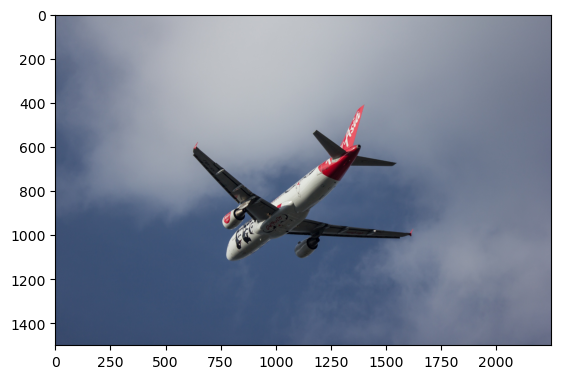

Number of masks selected: 1


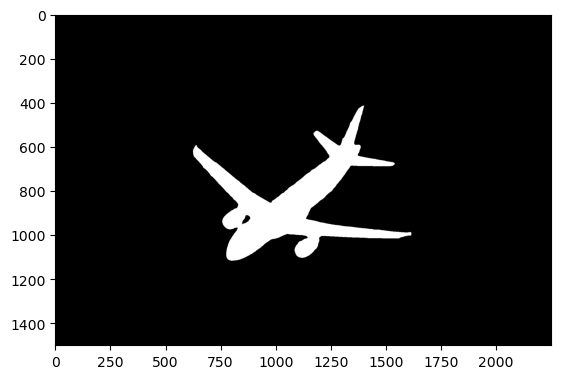

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


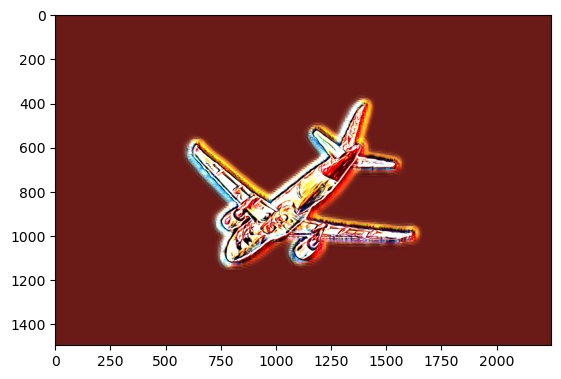

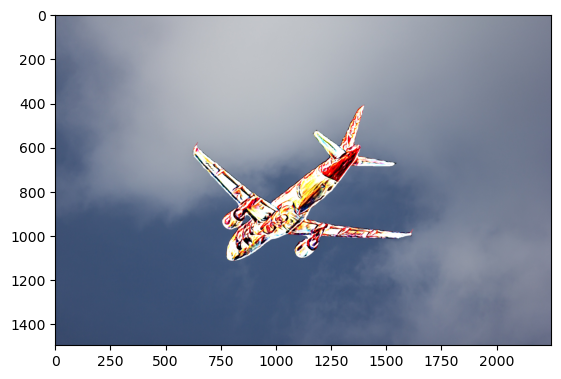

In [20]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_airplane

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

# Load JSON data
f = open('sa_235049.json',)
data = json.load(f)

# Load and display the image
im = plt.imread("sa_235049.jpg")
plt.imshow(im)
plt.show()

# Select masks interactively
...


# Print the number of masks selected
...

# Display the first mask
...

    
# Combine all masks into a single mask
...

# Ensure combined_mask is 2D
...

# Create an alpha channel from the combined mask
...

# Normalize image
...

# Prepare content and style images
...

# Ensure the tensors are correct
...

# Apply the combined mask to the style transfer
...

# Ensure the output has the correct shape before converting
...

# Convert to numpy and display
...
plt.imshow(...)
plt.show()

# Blend the result with the original image
...
plt.imshow(...)
plt.show()


## generateMasks.py

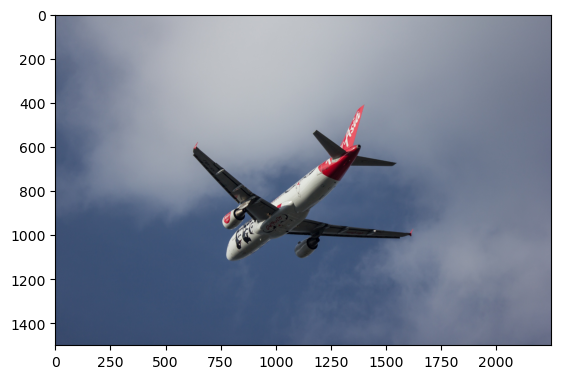

Number of annotations: 17


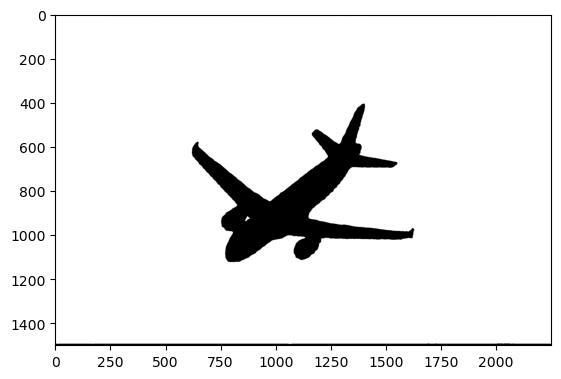

Number of masks selected: 1


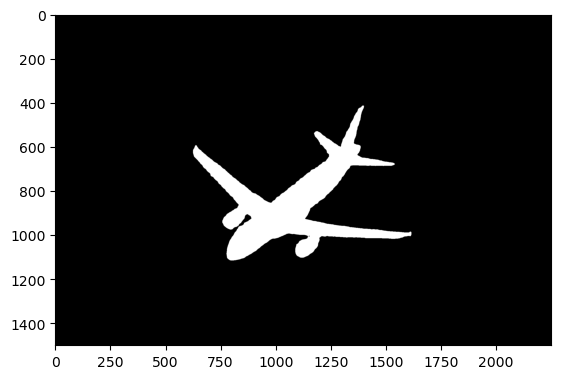

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


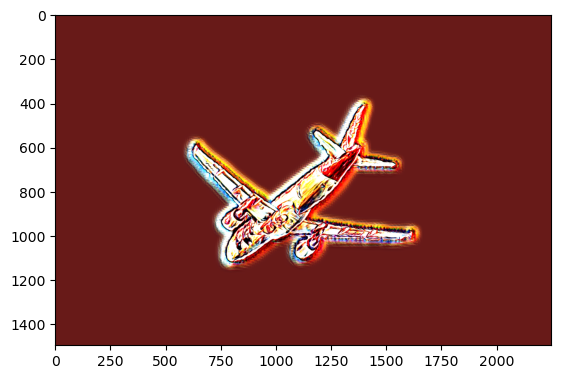

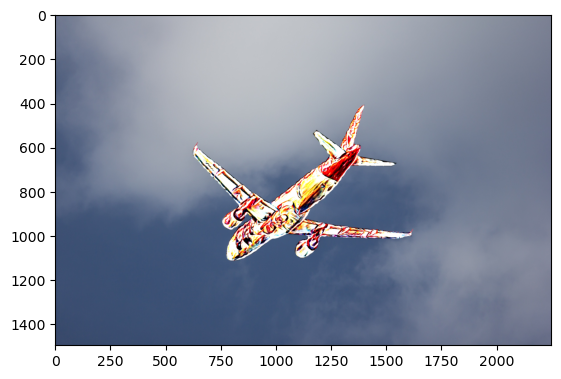

In [28]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_airplane

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_235049.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
...

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
...

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...
    # Prepare content and style images
...

    # Ensure the tensors are correct
...

    # Apply the combined mask to the style transfer
...

    # Ensure the output has the correct shape before converting
...

    # Convert to numpy and display
...
    plt.imshow(...)
    plt.show()

    # Blend the result with the original image
...
    plt.imshow(...)
    plt.show()
...

# Comparison of 3 types of style_then_mask, mask_then_style and style_with_partialConv in generateMasks.py for foreground pictures with small, medium and large masks.

# one style to one or different mask(s) in one picture.

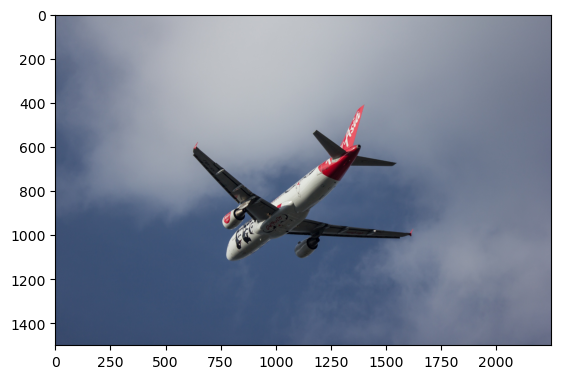

Number of annotations: 17


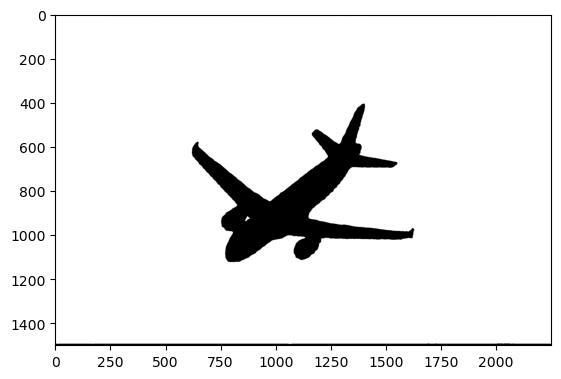

Number of masks selected: 1


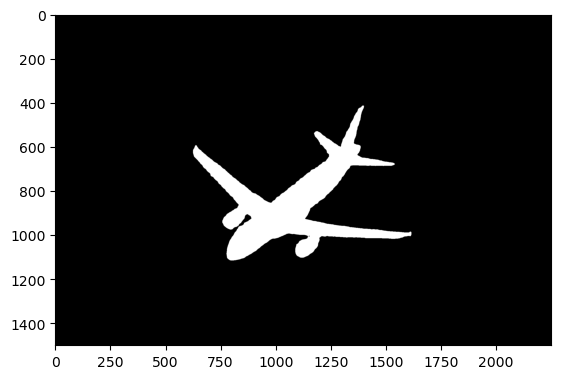

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


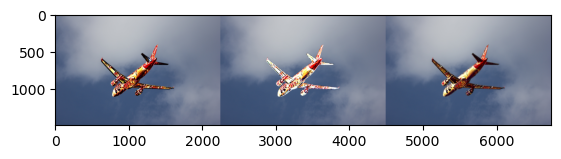

In [38]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_airplane

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_235049.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
...

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
...

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...

    # Prepare content and style images
...

    # Ensure the tensors are correct
...

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Ensure the output has the correct shape before converting
...

    # Convert to numpy and display
...
    
...


    # Blend the result with the original image
...
    
...
    
    plt.imshow(...)
    plt.show()
...

In [39]:
plt.imsave("foreground/medium/airplane.jpg",final)

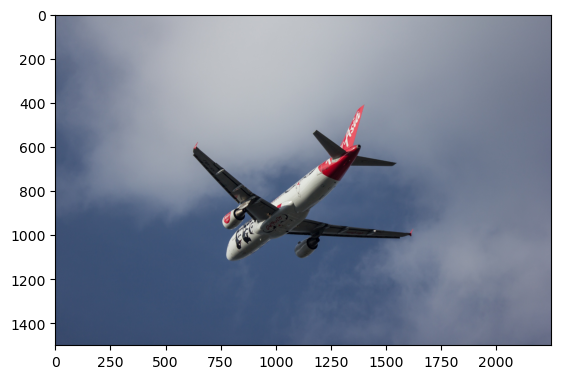

Number of annotations: 17


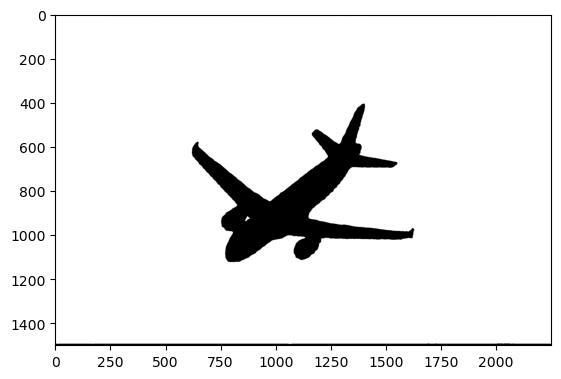

Number of masks selected: 1


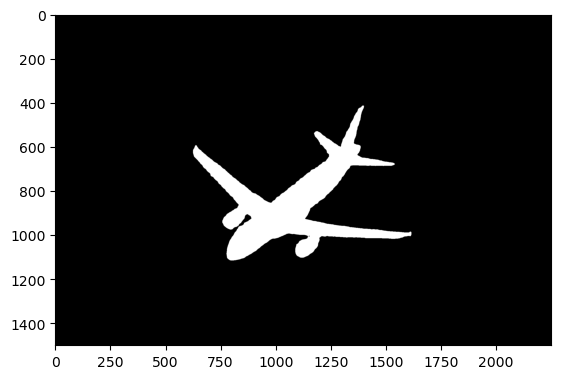

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
Colors [[0.43137255 0.45882353 0.56078431]
 [0.43137255 0.4627451  0.55294118]
 [0.43137255 0.4627451  0.55294118]
 ...
 [0.39607843 0.41960784 0.52156863]
 [0.40392157 0.42745098 0.52941176]
 [0.4        0.42352941 0.5254902 ]]
0.17292528820303793 0.1430674433297076
0.44891331880900465 0.4900263262164118 0.5745551651416123
0.4873698246390704
0.029903155300103727 0.024248198515553782 0.017317262524927674
0.024480467939015805
0.04221446919610729
4.674172275746906e-06
-0.44147379096518247
[ 1240   807   744   774   762   714   743   778   847   829   865   847
   859   733   784   863   830   849   845   877   903   962  1014  1145
  1383  1676  1899  2264  2730  3319  3605  3760  3627  3215  3308  3343
  3195  3329  3078  2983  2721  2769  2967  3013  3314  3537  3646  3738
  3516  3131  2683  2212  1775  1692  1934  3690  9527

14.090796506953627
Colors [[3.9215689e-03 5.1952509e-04 0.0000000e+00]
 [3.9215689e-03 3.9215689e-03 3.9215689e-03]
 [3.9215689e-03 3.9215689e-03 3.9215689e-03]
 ...
 [3.8806263e-03 0.0000000e+00 0.0000000e+00]
 [3.1929549e-03 0.0000000e+00 0.0000000e+00]
 [3.8100516e-03 7.6993259e-05 1.5204578e-03]]
0.0012456292 0.0009883245
0.0032100193 0.0025899333 0.0023223034
0.0027448293
1.5515919e-06 2.629049e-06 2.5951147e-06
1.9976824e-06
4.0067388942701476e-06
-2.176096e-09
-1.0139843618433375
[ 60424 118721      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0    

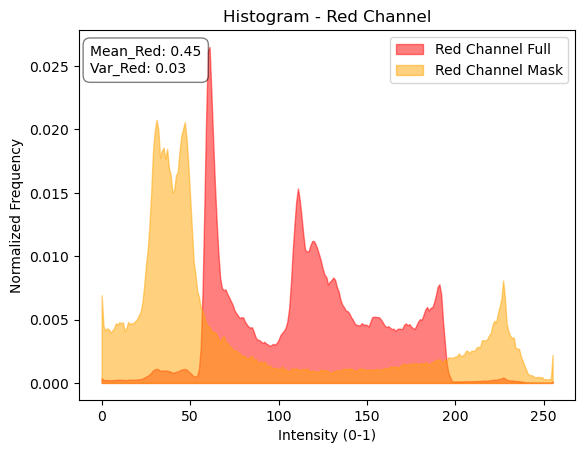

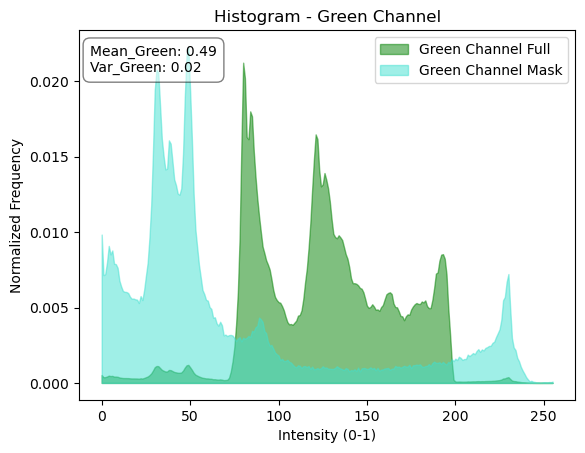

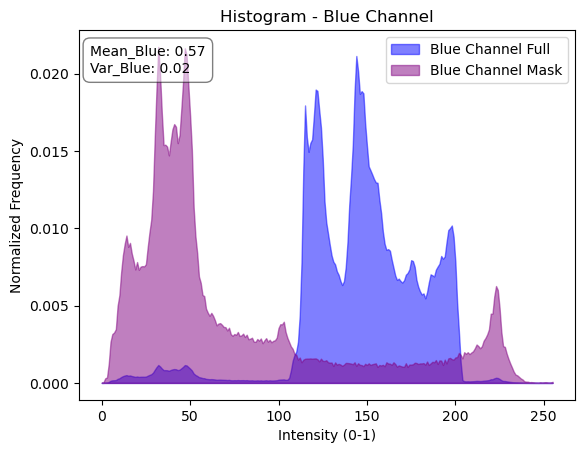

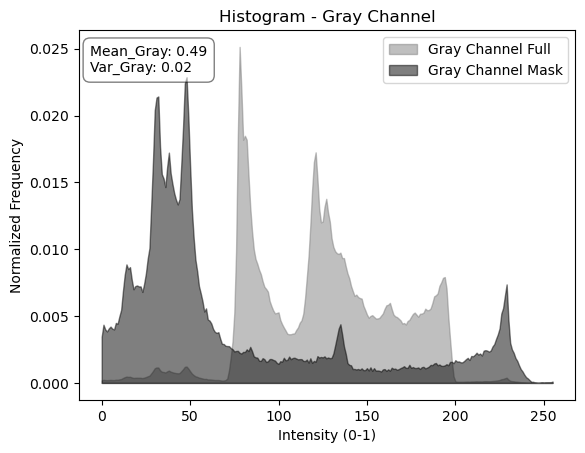

{
    "original_full": {
        "num_pixels": 3375000,
        "std_red": 0.17292528820303793,
        "L1_red": 0.1430674433297076,
        "mean_red": 0.44891331880900465,
        "mean_green": 0.4900263262164118,
        "mean_blue": 0.5745551651416123,
        "mean_gray": 0.4873698246390704,
        "var_red": 0.029903155300103727,
        "var_green": 0.024248198515553782,
        "var_blue": 0.017317262524927674,
        "var_gray": 0.024480467939015805,
        "total_var_RGB": 0.04221446919610729,
        "skewness_gray": 4.674172275746906e-06,
        "kurtosis_gray": -0.44147379096518247,
        "hist_red": [
            1240,
            807,
            744,
            774,
            762,
            714,
            743,
            778,
            847,
            829,
            865,
            847,
            859,
            733,
            784,
            863,
            830,
            849,
            845,
            877,
            903,
            

In [131]:
# Statistics and Area graphs:

# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_chimney

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor
from utils import calcStats, saveStats

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_235049.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
...

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...

    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/27.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Convert to numpy and display
    style_result1 = utils.toNumpy(output1)
    style_result2 = utils.toNumpy(output2)
    style_result3 = utils.toNumpy(output3)
    
    style_result1 = np.clip(style_result1, 0, 1)
    style_result2 = np.clip(style_result2, 0, 1)
    style_result3 = np.clip(style_result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    
    data_full = calcStats(content_im, None)
    data_style = calcStats(style_im, None)
    data0 = calcStats(content_im, mask)
    data1 = calcStats(style_result1, mask, isTensor=False)
    data2 = calcStats(style_result2, mask, isTensor=False)
    data3 = calcStats(style_result3, mask, isTensor=False)

    final_data = {}
    final_data["original_full"] = data_full
    final_data["style"] = data_style
    final_data["original_mask"] = data0
    final_data["style_then_mask"] = data1
    final_data["mask_then_style"] = data2
    final_data["partialConv"] = data3

    
#     # 2. Area graph (Area graph between 0-1)

    def plot_channel_histogram(x_full, y_full, x_mask, y_mask, color_full, color_mask, mean, var, title):
        
        # Normalize the histogram by dividing by the total number of pixels
...

        # Create the area plot
        plt.fill_between(x_full, y_full, alpha=0.5, label=f'{title} Channel Full', color=color_full)
        plt.fill_between(x_mask, y_mask, alpha=0.5, label=f'{title} Channel Mask', color=color_mask)

        # Add a text box for mean and variance in the upper-left corner
        textstr = f'Mean_{title}: {mean:.2f}\nVar_{title}: {var:.2f}'
        plt.gca().text(0.022, 0.96, textstr, transform=plt.gca().transAxes, fontsize=10, 
                       verticalalignment='top', horizontalalignment='left',
                       bbox=dict(facecolor='white', alpha=0.5, boxstyle='round,pad=0.5'))

        plt.title(f"Histogram - {title} Channel")
        plt.xlabel("Intensity (0-1)")
        plt.ylabel("Normalized Frequency")
        plt.legend()
        plt.show()

    # Plot Red Channel
    plot_channel_histogram(
...
    )

    # Plot Green Channel
    plot_channel_histogram(
...
    )

    # Plot Blue Channel
    plot_channel_histogram(
...
    )

    # Plot Gray Channel
    plot_channel_histogram(
...
    )
    
    
    saveStats(final_data,"foreground/medium/airplane.json")

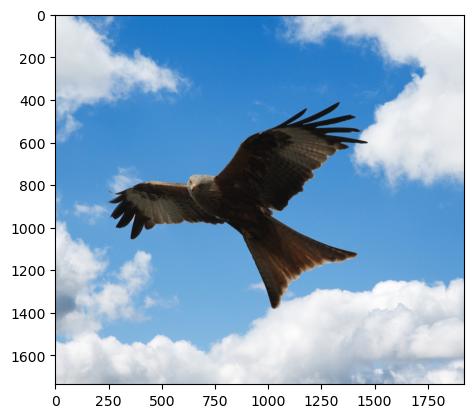

Number of annotations: 25


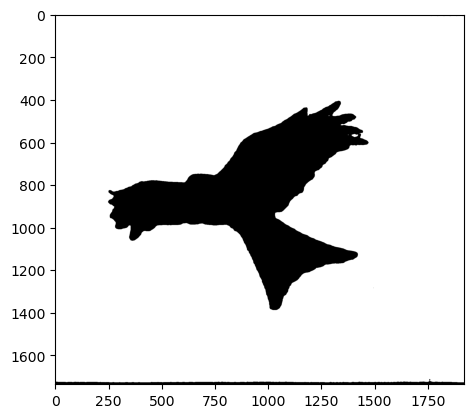

Number of masks selected: 1


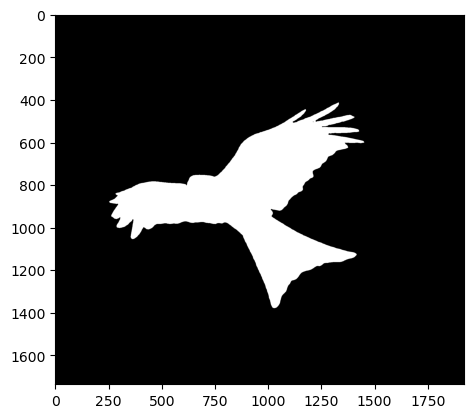

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1736, 1920])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 512, 512])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


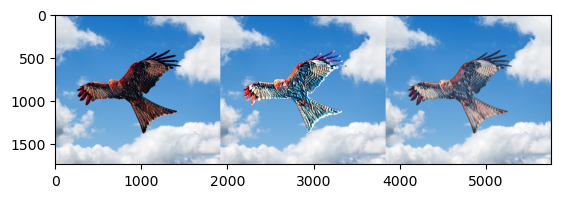

In [40]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_bird

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("data/content/FlyingBird.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
...

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
...

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...

    # Prepare content and style images
...

    # Ensure the tensors are correct
...

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Ensure the output has the correct shape before converting
...

    # Convert to numpy and display
...
    
...


    # Blend the result with the original image
...
    
...
    
    plt.imshow(...)
    plt.show()
...

In [41]:
plt.imsave("foreground/large/FlyingBird.jpg",final)

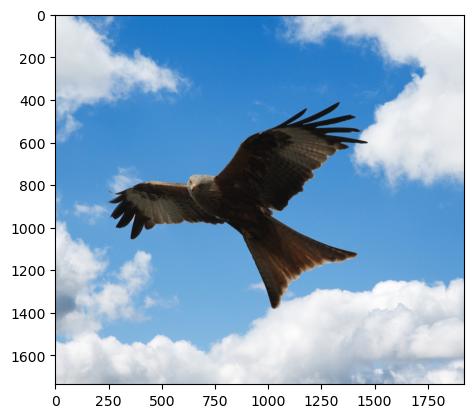

Number of annotations: 25


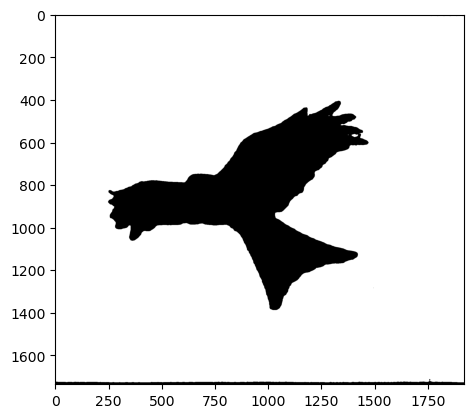

Number of masks selected: 1


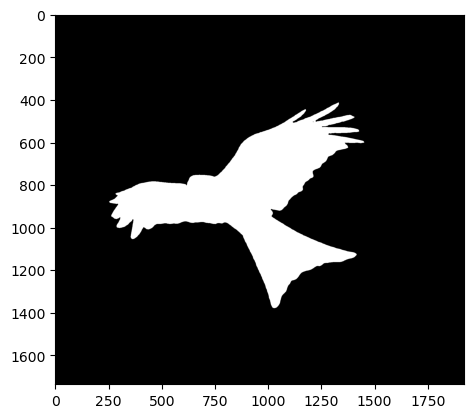

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1736, 1920])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 512, 512])
Colors [[0.94901961 0.95294118 0.96862745]
 [0.94509804 0.94901961 0.96470588]
 [0.94117647 0.94509804 0.96078431]
 ...
 [0.84313725 0.85490196 0.8745098 ]
 [0.84313725 0.8627451  0.87843137]
 [0.85490196 0.8745098  0.89019608]]
0.28523850826639374 0.2542885630477427
0.49049349511309903 0.635991502279675 0.7669896720448935
0.6074213894901038
0.08136100659803758 0.053461897595573966 0.05885451218074487
0.056271315178014314
0.11376133566901804
-0.006447500051166864
-0.3030407349554145
[    0     0     0     0     3     4     6     3     9    25    37   118
   446  1289  2998  5434  7928 10462 13242 15549 16653 16104 15160 14627
 14613 15213 15564 16256 16510 17111 17408 17145 16608 16182 15722 15575
 15717 16381 17358 17979 18392 18903 19009 18493 18061 17566 16655 15774
 15296 15320 15241 15784 16493 17628 18523 19238 19478 196

[    0     0     0     0     3     4     6     3     9    25    37   118
   443  1287  2980  5390  7856 10337 13031 15098 15929 14916 13347 11894
 10788  9949  9008  8456  7756  7429  7133  6775  6342  5868  5415  4904
  4536  4349  4286  4289  4135  4042  4090  3915  3959  3850  3869  3903
  3824  4089  3898  3890  3997  4012  4026  3874  3915  3892  3988  3924
  3648  3489  3270  3176  3155  2986  2945  2965  2966  2822  2881  2658
  2436  2243  2099  1818  1743  1621  1529  1466  1414  1385  1216  1220
  1159  1020   960   994   896   821   753   714   652   665   538   560
   537   557   475   446   446   362   402   382   376   385   374   344
   349   352   306   319   305   307   279   270   268   289   254   258
   266   236   238   219   210   188   200   215   167   183   188   184
   197   187   180   188   190   191   202   194   186   181   181   182
   180   191   181   184   183   178   185   221   218   183   190   185
   180   202   201   209   182   194   214   204   

[368415  20172      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      

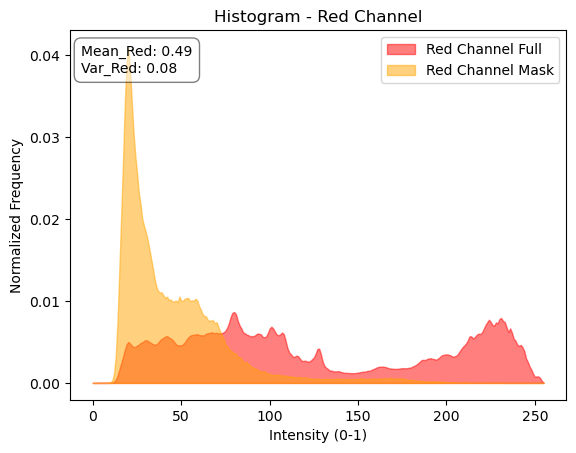

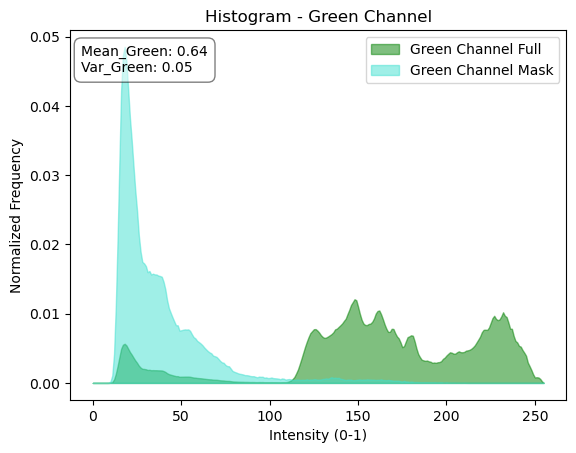

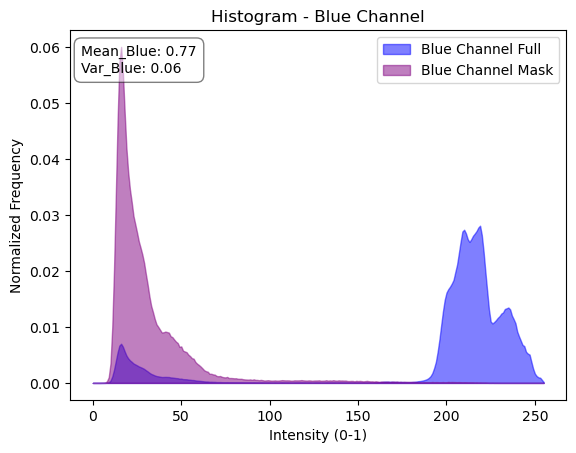

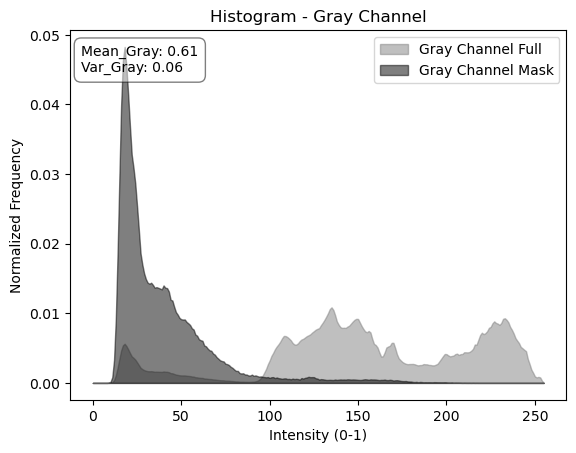

{
    "original_full": {
        "num_pixels": 3333120,
        "std_red": 0.28523850826639374,
        "L1_red": 0.2542885630477427,
        "mean_red": 0.49049349511309903,
        "mean_green": 0.635991502279675,
        "mean_blue": 0.7669896720448935,
        "mean_gray": 0.6074213894901038,
        "var_red": 0.08136100659803758,
        "var_green": 0.053461897595573966,
        "var_blue": 0.05885451218074487,
        "var_gray": 0.056271315178014314,
        "total_var_RGB": 0.11376133566901804,
        "skewness_gray": -0.006447500051166864,
        "kurtosis_gray": -0.3030407349554145,
        "hist_red": [
            0,
            0,
            0,
            0,
            3,
            4,
            6,
            3,
            9,
            25,
            37,
            118,
            446,
            1289,
            2998,
            5434,
            7928,
            10462,
            13242,
            15549,
            16653,
            16104,
      

In [130]:
# Statistics and Area graphs:

# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_chimney

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor
from utils import calcStats, saveStats

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("data/content/FlyingBird.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...

    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/antimonocromatismo.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...


    # Convert to numpy and display
    style_result1 = utils.toNumpy(output1)
    style_result2 = utils.toNumpy(output2)
    style_result3 = utils.toNumpy(output3)
    
    style_result1 = np.clip(style_result1, 0, 1)
    style_result2 = np.clip(style_result2, 0, 1)
    style_result3 = np.clip(style_result3, 0, 1)

    data_full = calcStats(content_im, None)
    data_style = calcStats(style_im, None)
    data0 = calcStats(content_im, mask)
    data1 = calcStats(style_result1, mask, isTensor=False)
    data2 = calcStats(style_result2, mask, isTensor=False)
    data3 = calcStats(style_result3, mask, isTensor=False)

    final_data = {}
    final_data["original_full"] = data_full
    final_data["style"] = data_style
    final_data["original_mask"] = data0
    final_data["style_then_mask"] = data1
    final_data["mask_then_style"] = data2
    final_data["partialConv"] = data3

    
#     # 2. Area graph (Area graph between 0-1)

    def plot_channel_histogram(x_full, y_full, x_mask, y_mask, color_full, color_mask, mean, var, title):
        
        # Normalize the histogram by dividing by the total number of pixels
...

        # Create the area plot
        plt.fill_between(x_full, y_full, alpha=0.5, label=f'{title} Channel Full', color=color_full)
        plt.fill_between(x_mask, y_mask, alpha=0.5, label=f'{title} Channel Mask', color=color_mask)

        # Add a text box for mean and variance in the upper-left corner
        textstr = f'Mean_{title}: {mean:.2f}\nVar_{title}: {var:.2f}'
        plt.gca().text(0.022, 0.96, textstr, transform=plt.gca().transAxes, fontsize=10, 
                       verticalalignment='top', horizontalalignment='left',
                       bbox=dict(facecolor='white', alpha=0.5, boxstyle='round,pad=0.5'))

        plt.title(f"Histogram - {title} Channel")
        plt.xlabel("Intensity (0-1)")
        plt.ylabel("Normalized Frequency")
        plt.legend()
        plt.show()

    # Plot Red Channel
    plot_channel_histogram(
...
    )

    # Plot Green Channel
    plot_channel_histogram(
...
    )

    # Plot Blue Channel
    plot_channel_histogram(
...
    )

    # Plot Gray Channel
    plot_channel_histogram(
... 
        title="Gray"
    )
    
    
    saveStats(final_data,"foreground/large/FlyingBird.json")

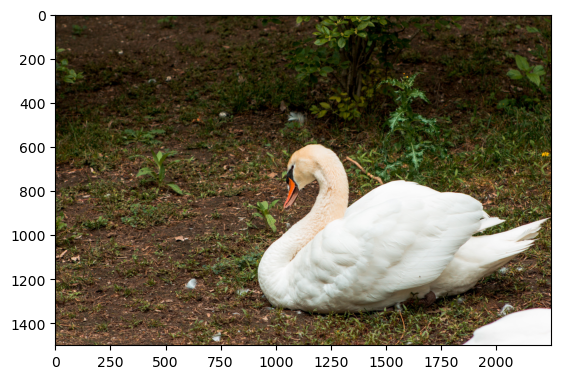

Number of annotations: 70


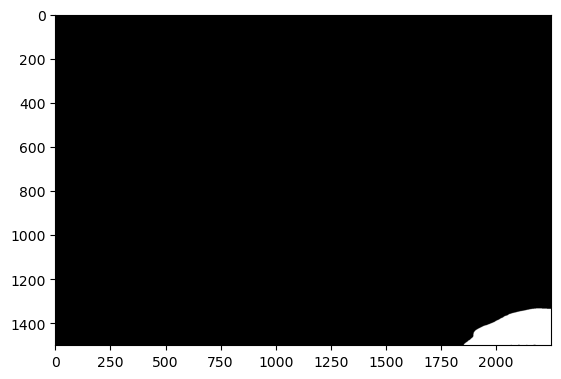

Number of masks selected: 2


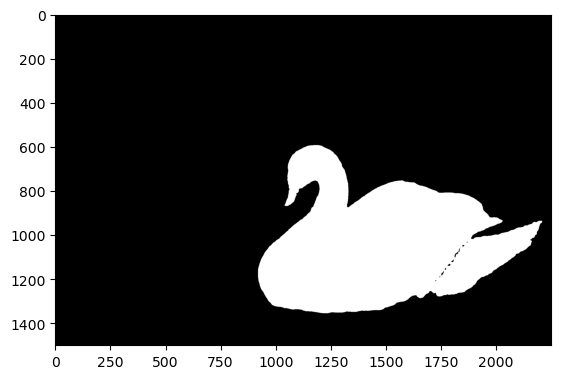

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 512, 512])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


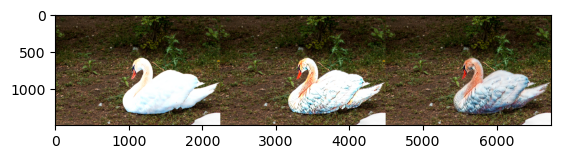

In [89]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_goose

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_224162.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...

    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/antimonocromatismo.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Ensure the output has the correct shape before converting
    print(f"output type: {type(output)}, shape: {output.shape}")

    # Convert to numpy and display
    result1 = utils.toNumpy(output1)
    result2 = utils.toNumpy(output2)
    result3 = utils.toNumpy(output3)
    
    result1 = np.clip(result1, 0, 1)
    result2 = np.clip(result2, 0, 1)
    result3 = np.clip(result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    # Blend the result with the original image
    final1 = ...
    final2 = ...
    final3 = ...
    
    final = np.hstack((final1,final2,final3))
    
    plt.imshow(final)
    plt.show()
else:
    print("No annotations found in the JSON data.")

In [90]:
plt.imsave("foreground/small/goose.jpg",final)

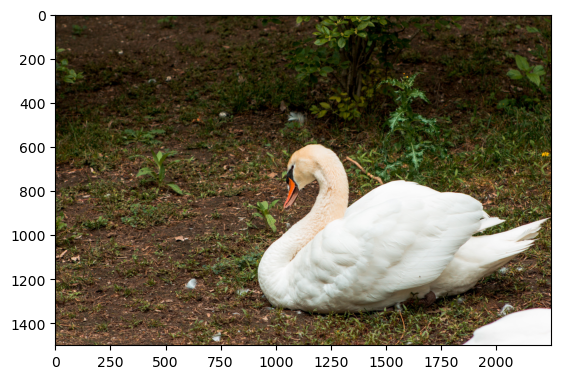

Number of annotations: 70


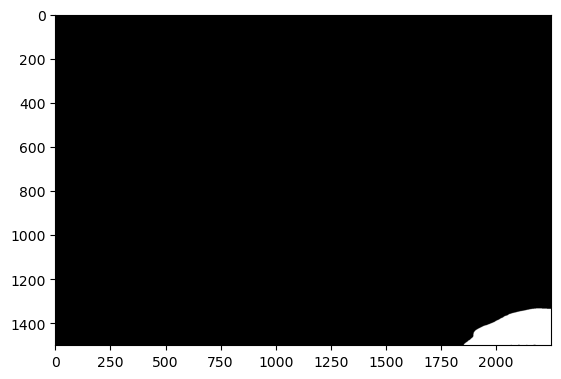

Number of masks selected: 1


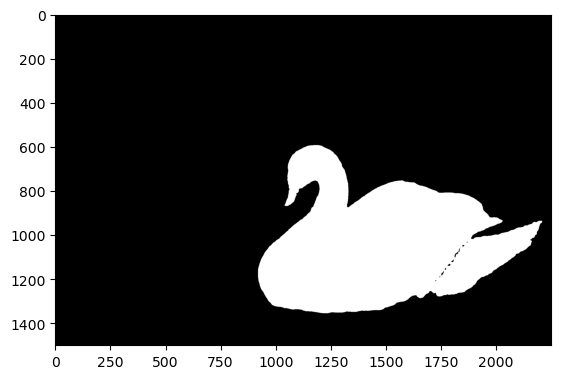

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 512, 512])
Colors [[0.21176471 0.19607843 0.05882353]
 [0.23529412 0.2        0.07058824]
 [0.2745098  0.21568627 0.09411765]
 ...
 [0.98039216 0.98039216 0.98039216]
 [0.98431373 0.98431373 0.98431373]
 [0.98431373 0.98431373 0.98431373]]
0.2672486093134494 0.2114651156304622
0.3606588525780685 0.32643317937545374 0.2336659346405227
0.3260911897632536
0.07142181917997271 0.07219937038407928 0.08233948057405803
0.07188663693069595
0.13074255389902656
0.024397467651791276
0.3894992099178425
[22550 10612  7759  8183  8157  7415  7699  7717  7975  8322  8751  9224
  9544 10170 10775 11699 12203 13154 13743 14922 15631 16495 17315 18623
 19142 20013 21449 21839 22935 23705 24636 25573 26381 26976 27637 27995
 28959 29648 29822 30642 31254 31821 31681 32899 33258 33769 34584 34337
 35110 35002 35776 35789 35484 36358 36152 36694 36724 36117 3

-0.010413827597091939
1.983349423654043
[    3     5     3     7     7     2     8     5     5    10     8    17
    14    11    18    21    16    28    31    26    32    27    24    38
    34    35    43    44    44    38    37    47    60    56    40    55
    56    71    72    71    58    66    88    71   104    99    95   111
   109   128   140   141   153   140   161   189   215   203   233   232
   228   277   284   286   335   347   335   357   383   386   383   434
   426   419   480   454   477   535   554   599   603   633   656   702
   693   728   733   774   758   810   817   898   901  1019  1044  1062
  1091  1021  1033  1035   915   934   831   839   832   749   758   749
   716   734   706   635   687   634   646   589   551   520   541   509
   541   512   577   555   588   554   585   624   615   651   635   648
   626   664   705   683   678   750   723   752   785   809   787   783
   835   886   952   879   941   931   907  1002  1013  1045  1054  1041
  1113  113

11.499207833325617
Colors [[0.00226695 0.00181058 0.00204402]
 [0.00331231 0.00290901 0.00326851]
 [0.00392157 0.00392157 0.00388918]
 ...
 [0.00199869 0.00253292 0.00306655]
 [0.00217004 0.00260232 0.00291622]
 [0.00282312 0.00294637 0.00331749]]
0.0008388356 0.0006182106
0.003466387 0.003464538 0.0033913434
0.0034567467
7.036451e-07 7.2048124e-07 8.1288846e-07
6.545092e-07
1.2942168784206476e-06
-1.085569e-09
3.730041580411055
[205629 344255      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0

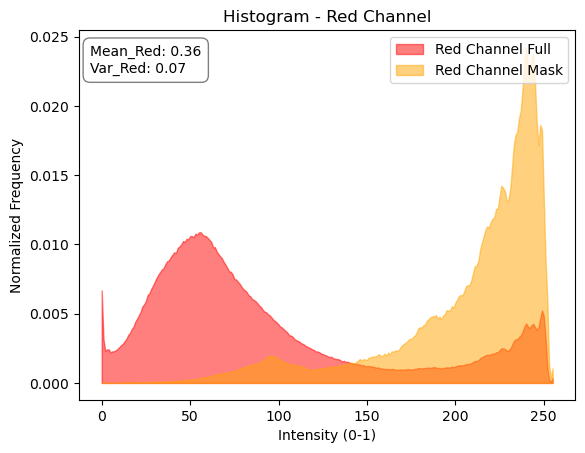

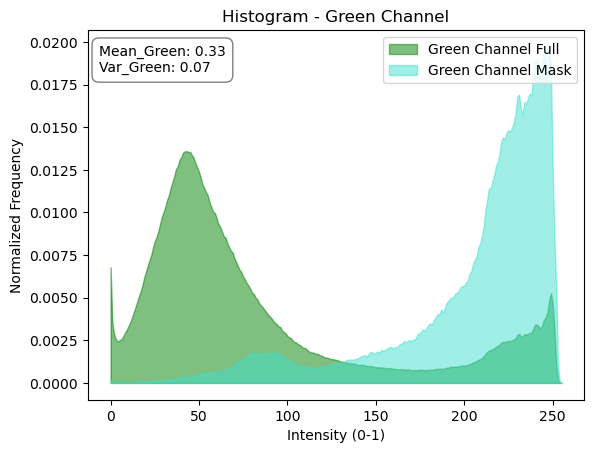

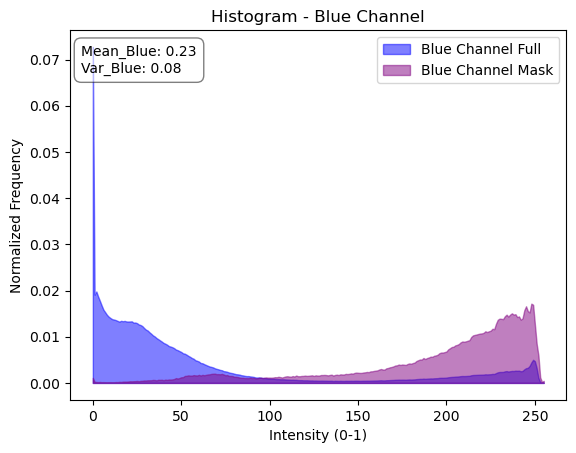

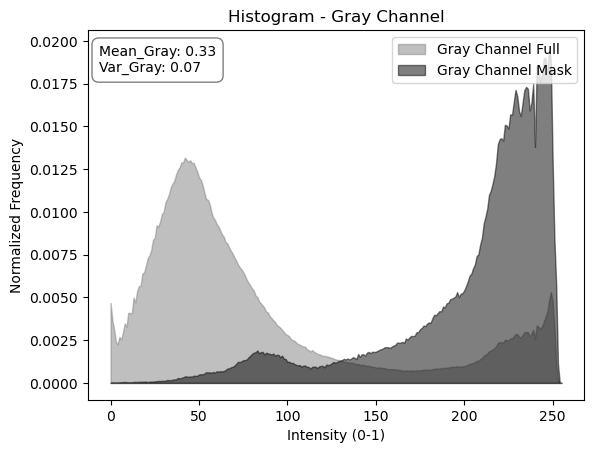

{
    "original_full": {
        "num_pixels": 3375000,
        "std_red": 0.2672486093134494,
        "L1_red": 0.2114651156304622,
        "mean_red": 0.3606588525780685,
        "mean_green": 0.32643317937545374,
        "mean_blue": 0.2336659346405227,
        "mean_gray": 0.3260911897632536,
        "var_red": 0.07142181917997271,
        "var_green": 0.07219937038407928,
        "var_blue": 0.08233948057405803,
        "var_gray": 0.07188663693069595,
        "total_var_RGB": 0.13074255389902656,
        "skewness_gray": 0.024397467651791276,
        "kurtosis_gray": 0.3894992099178425,
        "hist_red": [
            22550,
            10612,
            7759,
            8183,
            8157,
            7415,
            7699,
            7717,
            7975,
            8322,
            8751,
            9224,
            9544,
            10170,
            10775,
            11699,
            12203,
            13154,
            13743,
            14922,
         

In [142]:
# Statistics and Area graphs:

# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_chimney

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor
from utils import calcStats, saveStats

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_224162.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...

    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/antimonocromatismo.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Convert to numpy and display
    style_result1 = utils.toNumpy(output1)
    style_result2 = utils.toNumpy(output2)
    style_result3 = utils.toNumpy(output3)
    
    style_result1 = np.clip(style_result1, 0, 1)
    style_result2 = np.clip(style_result2, 0, 1)
    style_result3 = np.clip(style_result3, 0, 1)
    
    data_full = calcStats(content_im, None)
    data_style = calcStats(style_im, None)
    data0 = calcStats(content_im, mask)
    data1 = calcStats(style_result1, mask, isTensor=False)
    data2 = calcStats(style_result2, mask, isTensor=False)
    data3 = calcStats(style_result3, mask, isTensor=False)
    
    final_data = {}
    final_data["original_full"] = data_full
    final_data["style"] = data_style
    final_data["original_mask"] = data0
    final_data["style_then_mask"] = data1
    final_data["mask_then_style"] = data2
    final_data["partialConv"] = data3


#     # 2. Area graph (Area graph between 0-1)

    def plot_channel_histogram(x_full, y_full, x_mask, y_mask, color_full, color_mask, mean, var, title):
        
        # Normalize the histogram by dividing by the total number of pixels
...

        # Create the area plot
        plt.fill_between(x_full, y_full, alpha=0.5, label=f'{title} Channel Full', color=color_full)
        plt.fill_between(x_mask, y_mask, alpha=0.5, label=f'{title} Channel Mask', color=color_mask)

        # Add a text box for mean and variance in the upper-left corner
        textstr = f'Mean_{title}: {mean:.2f}\nVar_{title}: {var:.2f}'
        plt.gca().text(0.022, 0.96, textstr, transform=plt.gca().transAxes, fontsize=10, 
                       verticalalignment='top', horizontalalignment='left',
                       bbox=dict(facecolor='white', alpha=0.5, boxstyle='round,pad=0.5'))

        plt.title(f"Histogram - {title} Channel")
        plt.xlabel("Intensity (0-1)")
        plt.ylabel("Normalized Frequency")
        plt.legend()
        plt.show()

    # Plot Red Channel
    plot_channel_histogram(
...
    )

    # Plot Green Channel
    plot_channel_histogram(
...
    )

    # Plot Blue Channel
    plot_channel_histogram(
...
    )

    # Plot Gray Channel
    plot_channel_histogram(
...
    )


    saveStats(final_data,"foreground/small/goose.json")

# Comparison of 3 types of style_then_mask, mask_then_style and style_with_partialConv in generateMasks.py for background pictures with small, medium and large masks. 

# one style to one or different mask(s) in one picture.

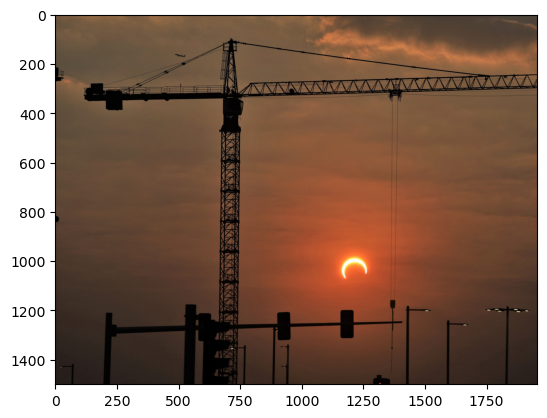

Number of annotations: 40


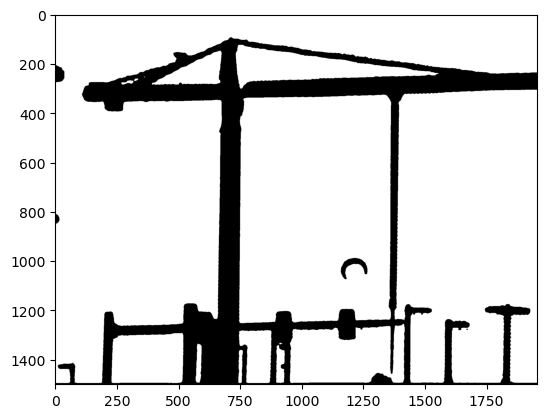

Number of masks selected: 1


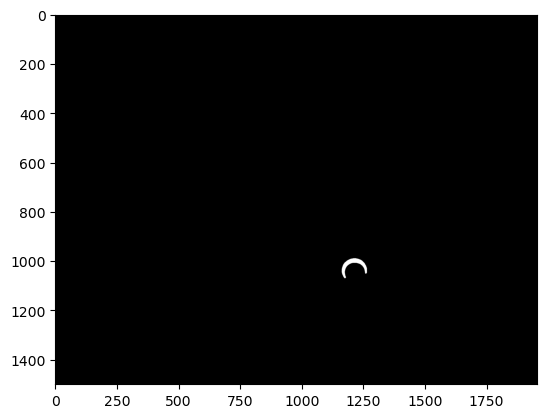

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 1957])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 512, 512])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


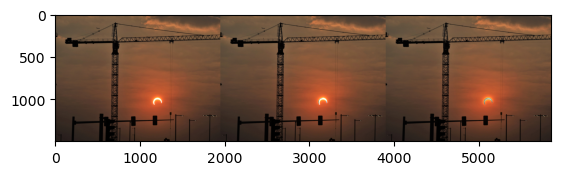

In [112]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_sunset

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_224493.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...

    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/antimonocromatismo.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Ensure the output has the correct shape before converting
    print(f"output type: {type(output)}, shape: {output.shape}")

    # Convert to numpy and display
    result1 = utils.toNumpy(output1)
    result2 = utils.toNumpy(output2)
    result3 = utils.toNumpy(output3)
    
    result1 = np.clip(result1, 0, 1)
    result2 = np.clip(result2, 0, 1)
    result3 = np.clip(result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    # Blend the result with the original image
    final1 = ...
    final2 = ...
    final3 = ...
    
    final = np.hstack((final1,final2,final3))
    
    plt.imshow(final)
    plt.show()
else:
    print("No annotations found in the JSON data.")

In [113]:
plt.imsave("background/small/sunset.jpg",final)

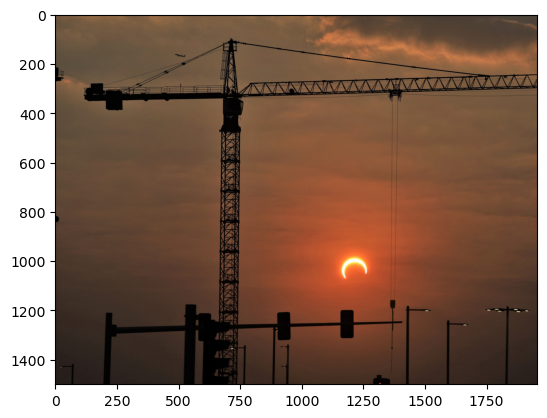

Number of annotations: 40


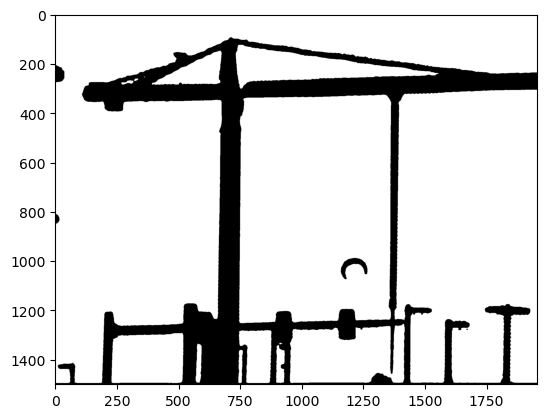

Number of masks selected: 1


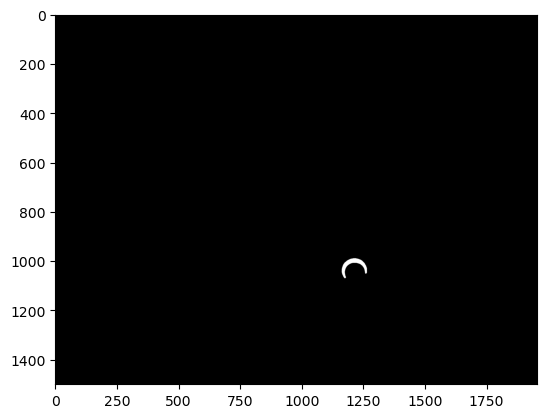

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 1957])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 512, 512])
Colors [[0.49411765 0.37254902 0.25882353]
 [0.49803922 0.37647059 0.26666667]
 [0.49019608 0.36862745 0.25882353]
 ...
 [0.16078431 0.12156863 0.11372549]
 [0.16078431 0.12156863 0.11372549]
 [0.16078431 0.12156863 0.11372549]]
0.16592688587020996 0.12484110980613301
0.41619332511747675 0.27575883187885947 0.19357691277498895
0.3083800065793646
0.027531731454585682 0.009910849850244232 0.004628079490968821
0.012439852838324147
0.029624994538670128
-0.0011166238848211393
1.860952875703922
[ 6774 18331 13495 26566 22662 11529 10613  9735  8248  7791  6107  4895
  4221  3603  3148  2786  2457  2288  2100  1881  1677  1634  1576  1470
  1397  1321  1300  1299  1340  1245  1266  1220  1196  1130  1182  1248
  1269  1526  2376  5107  4931  5700  6620  8406  8839  8839  8670  7878
  7098  6595  6254  6299  8415 12978 12804 16099 136

Colors [[0.0018686  0.00189379 0.00181413]
 [0.00180393 0.00192318 0.00193086]
 [0.00206097 0.00223813 0.00217463]
 ...
 [0.00023204 0.00016439 0.00013108]
 [0.00022242 0.00015922 0.00012371]
 [0.00022242 0.00015922 0.00012371]]
0.0009481062 0.00080443645
0.0022137747 0.0021651082 0.002004466
0.0021613464
8.9890534e-07 1.0346819e-06 9.3666523e-07
9.757182e-07
1.660102148824157e-06
-5.820219e-10
-0.9078341566232644
[2546    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    

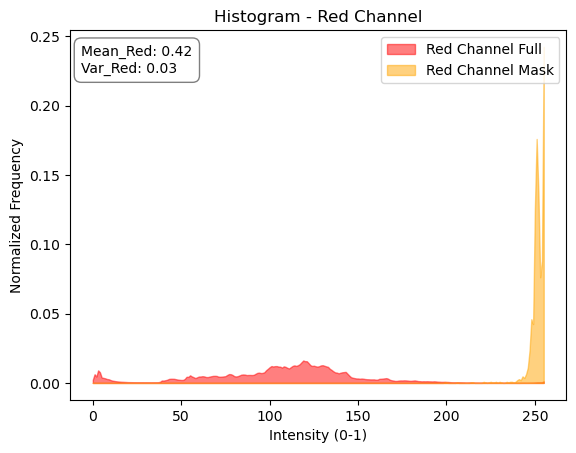

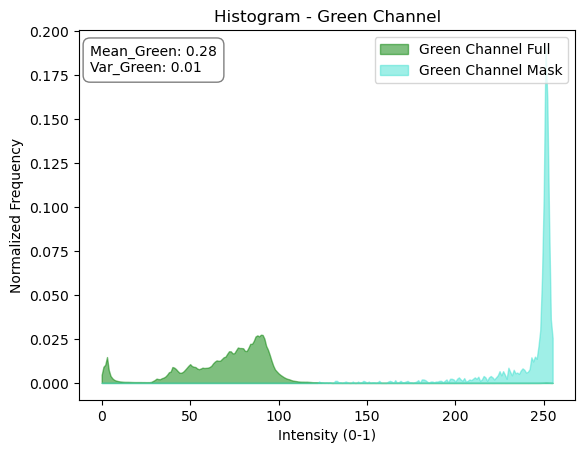

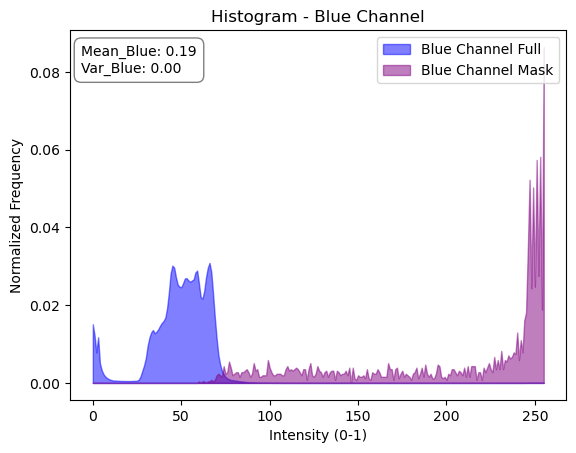

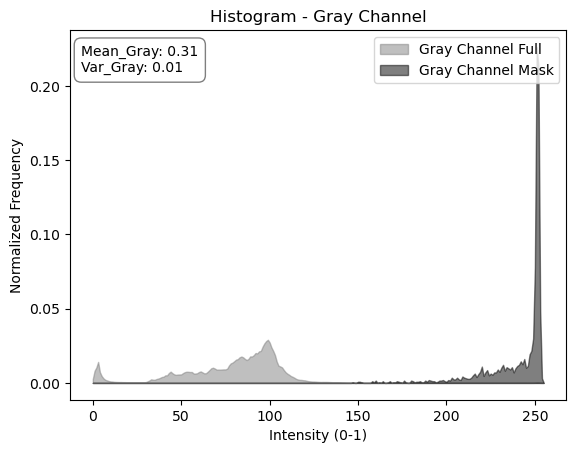

{
    "original_full": {
        "num_pixels": 2935500,
        "std_red": 0.16592688587020996,
        "L1_red": 0.12484110980613301,
        "mean_red": 0.41619332511747675,
        "mean_green": 0.27575883187885947,
        "mean_blue": 0.19357691277498895,
        "mean_gray": 0.3083800065793646,
        "var_red": 0.027531731454585682,
        "var_green": 0.009910849850244232,
        "var_blue": 0.004628079490968821,
        "var_gray": 0.012439852838324147,
        "total_var_RGB": 0.029624994538670128,
        "skewness_gray": -0.0011166238848211393,
        "kurtosis_gray": 1.860952875703922,
        "hist_red": [
            6774,
            18331,
            13495,
            26566,
            22662,
            11529,
            10613,
            9735,
            8248,
            7791,
            6107,
            4895,
            4221,
            3603,
            3148,
            2786,
            2457,
            2288,
            2100,
            1881,
  

In [121]:
# Statistics and Area graphs:

# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_chimney

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor
from utils import calcStats, saveStats

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_224493.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...
    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/antimonocromatismo.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Convert to numpy and display
    style_result1 = utils.toNumpy(output1)
    style_result2 = utils.toNumpy(output2)
    style_result3 = utils.toNumpy(output3)
    
    style_result1 = np.clip(style_result1, 0, 1)
    style_result2 = np.clip(style_result2, 0, 1)
    style_result3 = np.clip(style_result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    
    data_full = calcStats(content_im, None)
    data_style = calcStats(style_im, None)
    data0 = calcStats(content_im, mask)
    data1 = calcStats(style_result1, mask, isTensor=False)
    data2 = calcStats(style_result2, mask, isTensor=False)
    data3 = calcStats(style_result3, mask, isTensor=False)

    final_data = {}
    final_data["original_full"] = data_full
    final_data["style"] = data_style
    final_data["original_mask"] = data0
    final_data["style_then_mask"] = data1
    final_data["mask_then_style"] = data2
    final_data["partialConv"] = data3

    
#     # 2. Area graph (Area graph between 0-1)

    def plot_channel_histogram(x_full, y_full, x_mask, y_mask, color_full, color_mask, mean, var, title):
        
        # Normalize the histogram by dividing by the total number of pixels
...

        # Create the area plot
        plt.fill_between(x_full, y_full, alpha=0.5, label=f'{title} Channel Full', color=color_full)
        plt.fill_between(x_mask, y_mask, alpha=0.5, label=f'{title} Channel Mask', color=color_mask)

        # Add a text box for mean and variance in the upper-left corner
        textstr = f'Mean_{title}: {mean:.2f}\nVar_{title}: {var:.2f}'
        plt.gca().text(0.022, 0.96, textstr, transform=plt.gca().transAxes, fontsize=10, 
                       verticalalignment='top', horizontalalignment='left',
                       bbox=dict(facecolor='white', alpha=0.5, boxstyle='round,pad=0.5'))

        plt.title(f"Histogram - {title} Channel")
        plt.xlabel("Intensity (0-1)")
        plt.ylabel("Normalized Frequency")
        plt.legend()
        plt.show()

    # Plot Red Channel
    plot_channel_histogram(
...
    )

    # Plot Green Channel
    plot_channel_histogram(
...
    )

    # Plot Blue Channel
    plot_channel_histogram(
...
    )

    # Plot Gray Channel
    plot_channel_histogram(
...
    )
    
    saveStats(final_data,"background/small/sunset.json")

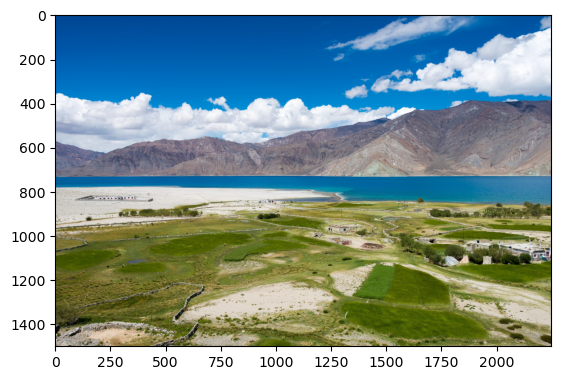

Number of annotations: 106


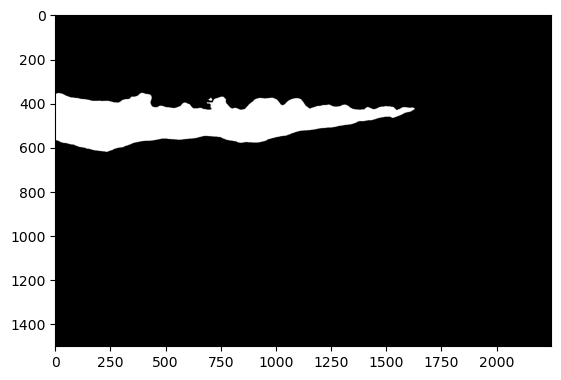

Number of masks selected: 2


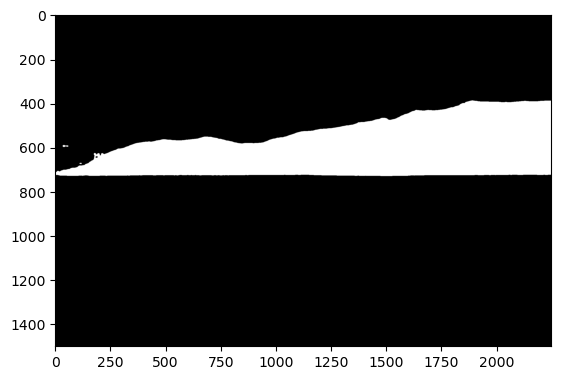

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2248])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


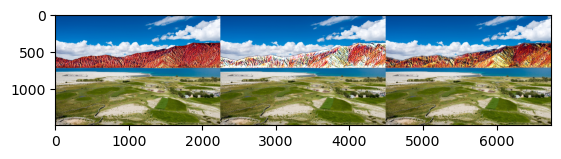

In [121]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_mountain

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_224508.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...

    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/27.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Ensure the output has the correct shape before converting
    print(f"output type: {type(output)}, shape: {output.shape}")

    # Convert to numpy and display
    result1 = utils.toNumpy(output1)
    result2 = utils.toNumpy(output2)
    result3 = utils.toNumpy(output3)
    
    result1 = np.clip(result1, 0, 1)
    result2 = np.clip(result2, 0, 1)
    result3 = np.clip(result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    # Blend the result with the original image
    final1 = ...
    final2 = ...
    final3 = ...
    
    final = np.hstack((final1,final2,final3))
    
    plt.imshow(final)
    plt.show()
else:
    print("No annotations found in the JSON data.")

In [122]:
plt.imsave("background/medium/mountain.jpg",final)

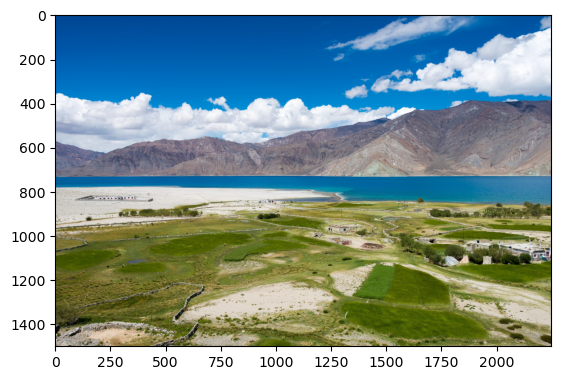

Number of annotations: 106


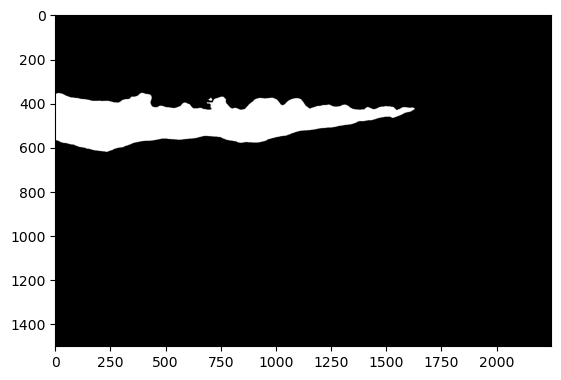

Number of masks selected: 2


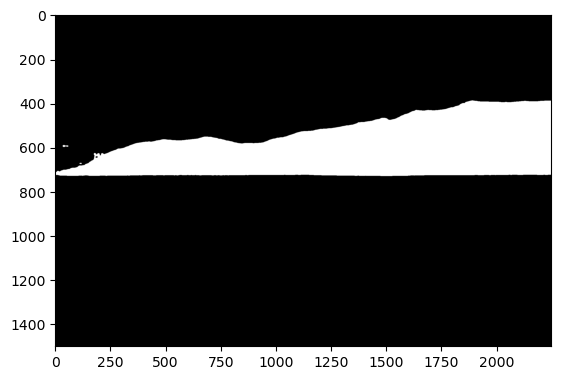

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2248])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
Colors [[0.         0.27843137 0.57647059]
 [0.00392157 0.28627451 0.58431373]
 [0.         0.28235294 0.58039216]
 ...
 [0.63921569 0.57647059 0.47843137]
 [0.65490196 0.59215686 0.49411765]
 [0.60784314 0.5372549  0.44313725]]
0.3048413514630668 0.25835410893322697
0.421928722117554 0.5293557823366596 0.522603741306724
0.49646535865373426
0.092928249561829 0.0372676697201508 0.0789561257985038
0.04529698557750121
0.12750924897475074
0.006117286343900639
-0.7772207775872904
[451980 224855  79952  24519  12587   8269   5703   3961   3059   2372
   2044   1792   1615   1520   1380   1358   1347   1304   1325   1339
   1316   1416   1335   1402   1381   1473   1495   1531   1543   1596
   1598   1681   1737   1791   1840   1916   2068   2137   2192   2197
   2245   2547   2555   2711   2799   2955   3124   3314   3549   3681
   

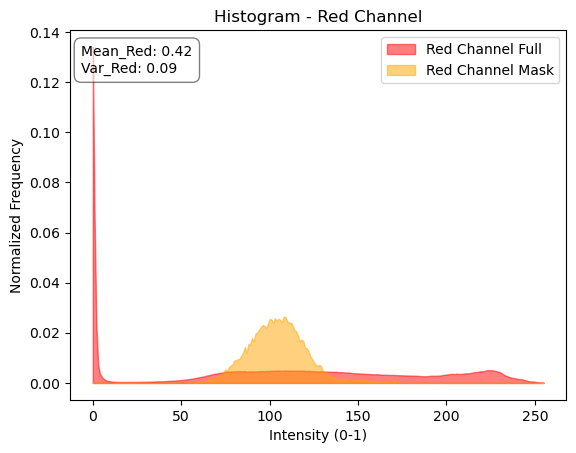

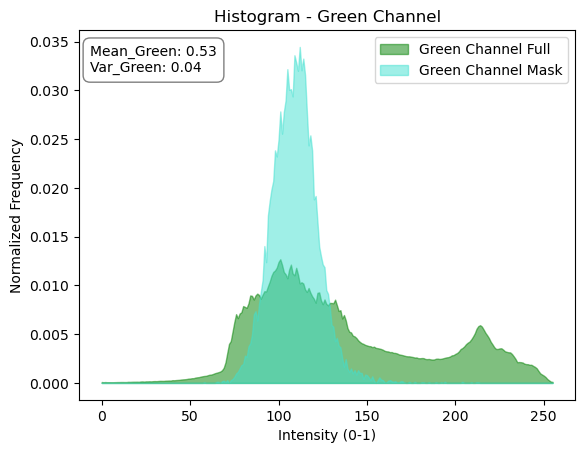

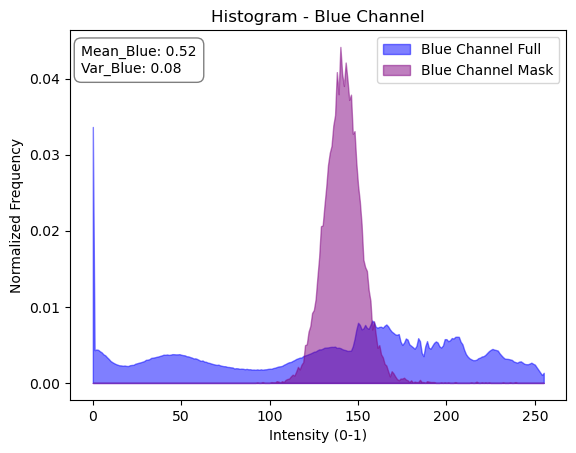

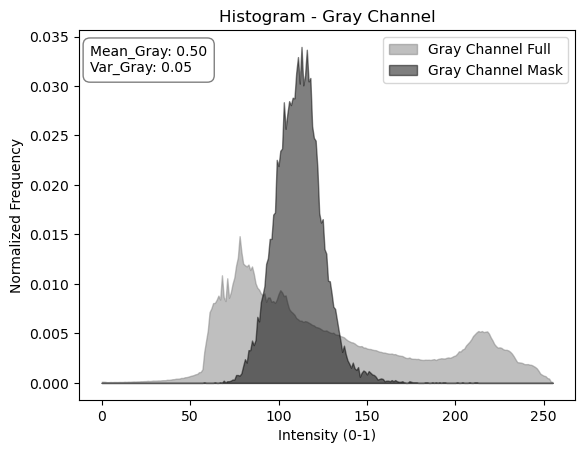

{
    "original_full": {
        "num_pixels": 3372000,
        "std_red": 0.3048413514630668,
        "L1_red": 0.25835410893322697,
        "mean_red": 0.421928722117554,
        "mean_green": 0.5293557823366596,
        "mean_blue": 0.522603741306724,
        "mean_gray": 0.49646535865373426,
        "var_red": 0.092928249561829,
        "var_green": 0.0372676697201508,
        "var_blue": 0.0789561257985038,
        "var_gray": 0.04529698557750121,
        "total_var_RGB": 0.12750924897475074,
        "skewness_gray": 0.006117286343900639,
        "kurtosis_gray": -0.7772207775872904,
        "hist_red": [
            451980,
            224855,
            79952,
            24519,
            12587,
            8269,
            5703,
            3961,
            3059,
            2372,
            2044,
            1792,
            1615,
            1520,
            1380,
            1358,
            1347,
            1304,
            1325,
            1339,
            131

In [119]:
# Statistics and Area graphs:

# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_chimney

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor
from utils import calcStats, saveStats

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_224508.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...
    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/27.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Convert to numpy and display
    style_result1 = utils.toNumpy(output1)
    style_result2 = utils.toNumpy(output2)
    style_result3 = utils.toNumpy(output3)
    
    style_result1 = np.clip(style_result1, 0, 1)
    style_result2 = np.clip(style_result2, 0, 1)
    style_result3 = np.clip(style_result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    
    data_full = calcStats(content_im, None)
    data_style = calcStats(style_im, None)
    data0 = calcStats(content_im, mask)
    data1 = calcStats(style_result1, mask, isTensor=False)
    data2 = calcStats(style_result2, mask, isTensor=False)
    data3 = calcStats(style_result3, mask, isTensor=False)

    final_data = {}
    final_data["original_full"] = data_full
    final_data["style"] = data_style
    final_data["original_mask"] = data0
    final_data["style_then_mask"] = data1
    final_data["mask_then_style"] = data2
    final_data["partialConv"] = data3

    
#     # 2. Area graph (Area graph between 0-1)

    def plot_channel_histogram(x_full, y_full, x_mask, y_mask, color_full, color_mask, mean, var, title):
        
        # Normalize the histogram by dividing by the total number of pixels
...

        # Create the area plot
        plt.fill_between(x_full, y_full, alpha=0.5, label=f'{title} Channel Full', color=color_full)
        plt.fill_between(x_mask, y_mask, alpha=0.5, label=f'{title} Channel Mask', color=color_mask)

        # Add a text box for mean and variance in the upper-left corner
        textstr = f'Mean_{title}: {mean:.2f}\nVar_{title}: {var:.2f}'
        plt.gca().text(0.022, 0.96, textstr, transform=plt.gca().transAxes, fontsize=10, 
                       verticalalignment='top', horizontalalignment='left',
                       bbox=dict(facecolor='white', alpha=0.5, boxstyle='round,pad=0.5'))

        plt.title(f"Histogram - {title} Channel")
        plt.xlabel("Intensity (0-1)")
        plt.ylabel("Normalized Frequency")
        plt.legend()
        plt.show()

    # Plot Red Channel
    plot_channel_histogram(
...
    )

    # Plot Green Channel
    plot_channel_histogram(
...
    )

    # Plot Blue Channel
    plot_channel_histogram(
...
        title="Blue"
    )

    # Plot Gray Channel
    plot_channel_histogram(
...
    
    saveStats(final_data,"background/medium/mountain.json")

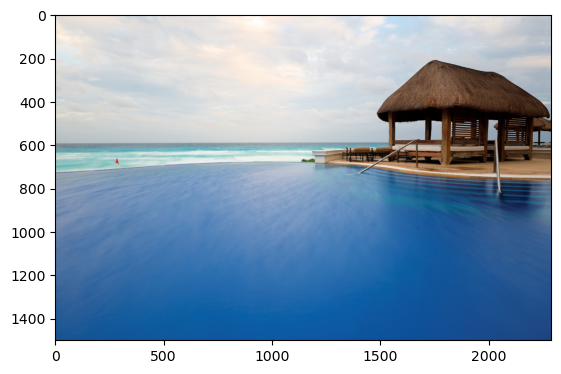

Number of annotations: 17


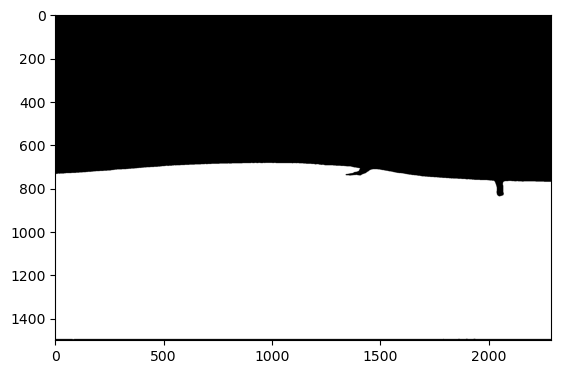

Number of masks selected: 2


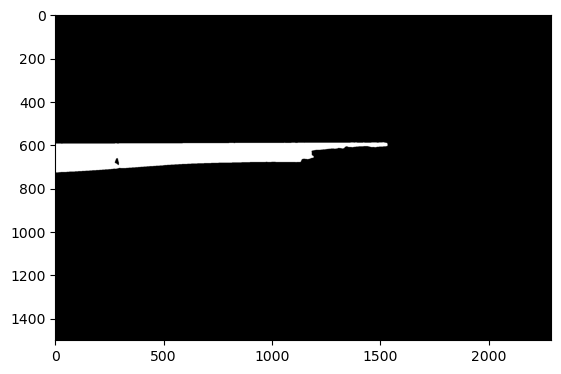

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2289])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
output type: <class 'torch.Tensor'>, shape: torch.Size([3, 1, 3, 1496, 2248])


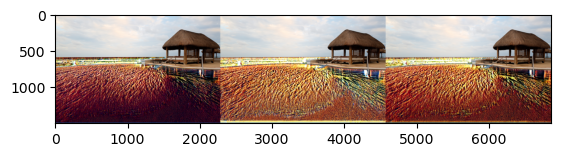

In [139]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_ocean

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_224350.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...

    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/27.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Ensure the output has the correct shape before converting
    print(f"output type: {type(output)}, shape: {output.shape}")

    # Convert to numpy and display
    result1 = utils.toNumpy(output1)
    result2 = utils.toNumpy(output2)
    result3 = utils.toNumpy(output3)
    
    result1 = np.clip(result1, 0, 1)
    result2 = np.clip(result2, 0, 1)
    result3 = np.clip(result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    # Blend the result with the original image
    final1 = ...
    final2 = ...
    final3 = ...
    
    final = np.hstack((final1,final2,final3))
    
    plt.imshow(final)
    plt.show()
else:
    print("No annotations found in the JSON data.")

In [140]:
plt.imsave("background/large/ocean.jpg",final)

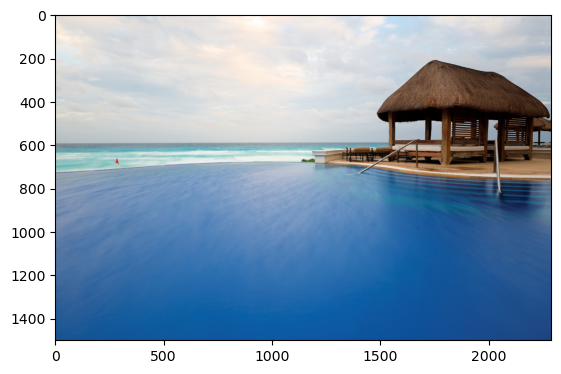

Number of annotations: 17


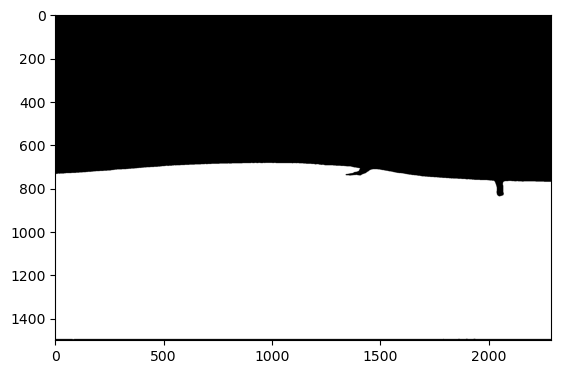

Number of masks selected: 2


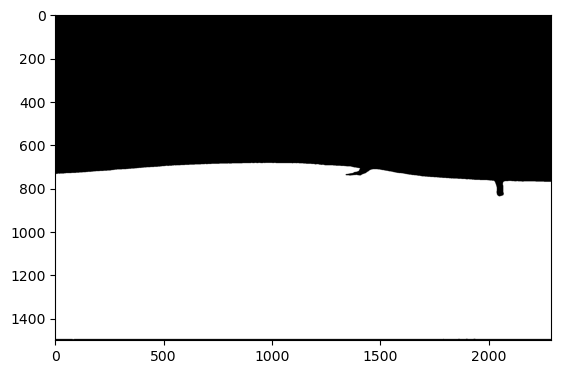

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2289])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 256, 256])
Colors [[0.88627451 0.86666667 0.84313725]
 [0.88627451 0.86666667 0.84313725]
 [0.88627451 0.86666667 0.84313725]
 ...
 [0.10588235 0.26666667 0.51764706]
 [0.09411765 0.26666667 0.51372549]
 [0.10196078 0.2627451  0.50588235]]
0.3203734105278434 0.29025628973806833
0.4682284914781409 0.5729005799261596 0.6788892486658271
0.5536863337165242
0.10263912217324207 0.06091067852931428 0.044724910934922785
0.06568775900016811
0.1274567291967433
0.0007546495888250077
-1.316552590149897
[ 4149  6183  4849  3422  2223  2913  2710  3227  4851  5619 13087 18412
 28961 57507 46950 51660 38291 31344 28076 27893 25988 24990 23052 23033
 23261 24851 27119 28737 30013 31625 27678 23552 19748 18721 18116 18494
 19137 20606 21142 21012 20800 20240 20608 20535 20242 18728 17862 16983
 16911 17299 17600 17129 16570 15524 15537 14725 14138 13394 

Colors [[0.00392157 0.00238409 0.00235917]
 [0.00392157 0.00273603 0.00257668]
 [0.00392157 0.00288284 0.00248663]
 ...
 [0.00186273 0.         0.        ]
 [0.00201597 0.         0.        ]
 [0.00196274 0.         0.        ]]
0.0007956214 0.00059646345
0.0034484335 0.0031945733 0.002309198
0.0031695445
6.330135e-07 9.552263e-07 1.2406014e-06
7.8688015e-07
1.6888620475038962e-06
-1.0693497e-09
1.927022650710363
[56519 71993     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0

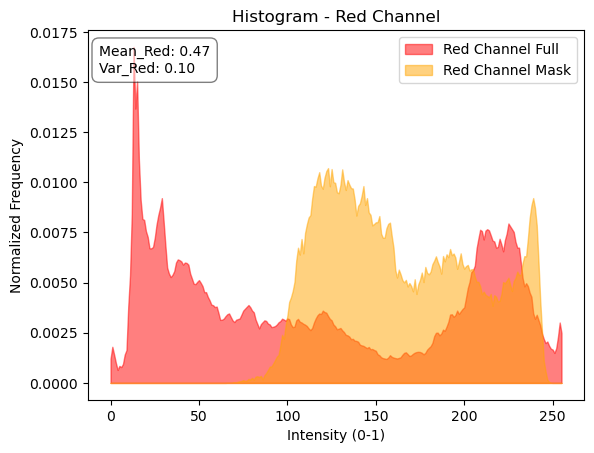

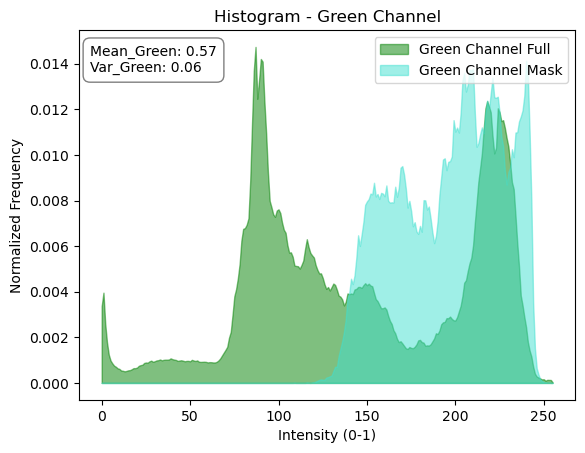

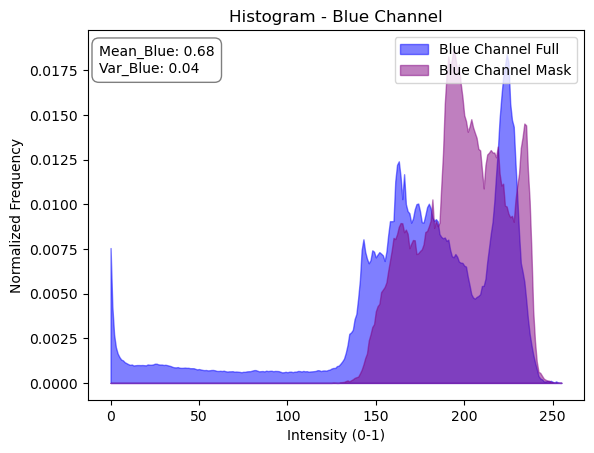

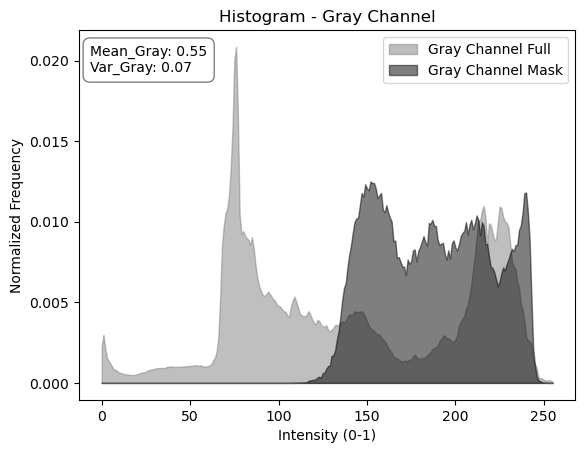

{
    "original_full": {
        "num_pixels": 3433500,
        "std_red": 0.3203734105278434,
        "L1_red": 0.29025628973806833,
        "mean_red": 0.4682284914781409,
        "mean_green": 0.5729005799261596,
        "mean_blue": 0.6788892486658271,
        "mean_gray": 0.5536863337165242,
        "var_red": 0.10263912217324207,
        "var_green": 0.06091067852931428,
        "var_blue": 0.044724910934922785,
        "var_gray": 0.06568775900016811,
        "total_var_RGB": 0.1274567291967433,
        "skewness_gray": 0.0007546495888250077,
        "kurtosis_gray": -1.316552590149897,
        "hist_red": [
            4149,
            6183,
            4849,
            3422,
            2223,
            2913,
            2710,
            3227,
            4851,
            5619,
            13087,
            18412,
            28961,
            57507,
            46950,
            51660,
            38291,
            31344,
            28076,
            27893,
       

In [141]:
# Statistics and Area graphs:

# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_chimney

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor
from utils import calcStats, saveStats

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_224350.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...
    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/27.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Convert to numpy and display
    style_result1 = utils.toNumpy(output1)
    style_result2 = utils.toNumpy(output2)
    style_result3 = utils.toNumpy(output3)
    
    style_result1 = np.clip(style_result1, 0, 1)
    style_result2 = np.clip(style_result2, 0, 1)
    style_result3 = np.clip(style_result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    
    data_full = calcStats(content_im, None)
    data_style = calcStats(style_im, None)
    data0 = calcStats(content_im, mask)
    data1 = calcStats(style_result1, mask, isTensor=False)
    data2 = calcStats(style_result2, mask, isTensor=False)
    data3 = calcStats(style_result3, mask, isTensor=False)

    final_data = {}
    final_data["original_full"] = data_full
    final_data["style"] = data_style
    final_data["original_mask"] = data0
    final_data["style_then_mask"] = data1
    final_data["mask_then_style"] = data2
    final_data["partialConv"] = data3

    
#     # 2. Area graph (Area graph between 0-1)

    def plot_channel_histogram(x_full, y_full, x_mask, y_mask, color_full, color_mask, mean, var, title):
        
        # Normalize the histogram by dividing by the total number of pixels
...

        # Create the area plot
        plt.fill_between(x_full, y_full, alpha=0.5, label=f'{title} Channel Full', color=color_full)
        plt.fill_between(x_mask, y_mask, alpha=0.5, label=f'{title} Channel Mask', color=color_mask)

        # Add a text box for mean and variance in the upper-left corner
        textstr = f'Mean_{title}: {mean:.2f}\nVar_{title}: {var:.2f}'
        plt.gca().text(0.022, 0.96, textstr, transform=plt.gca().transAxes, fontsize=10, 
                       verticalalignment='top', horizontalalignment='left',
                       bbox=dict(facecolor='white', alpha=0.5, boxstyle='round,pad=0.5'))

        plt.title(f"Histogram - {title} Channel")
        plt.xlabel("Intensity (0-1)")
        plt.ylabel("Normalized Frequency")
        plt.legend()
        plt.show()

    # Plot Red Channel
    plot_channel_histogram(
...
    )

    # Plot Green Channel
    plot_channel_histogram(
...
    )

    # Plot Blue Channel
    plot_channel_histogram(
...
        title="Blue"
    )

    # Plot Gray Channel
    plot_channel_histogram(
...
    )
    
    saveStats(final_data,"background/large/ocean.json")

# Comparison of 3 types of style_then_mask, mask_then_style and style_with_partialConv in generateMasks.py for foreground pictures with very small masks.

# one style to one or different mask(s) in one picture.

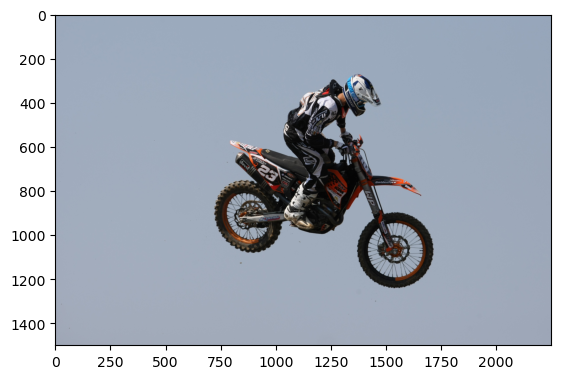

Number of annotations: 22


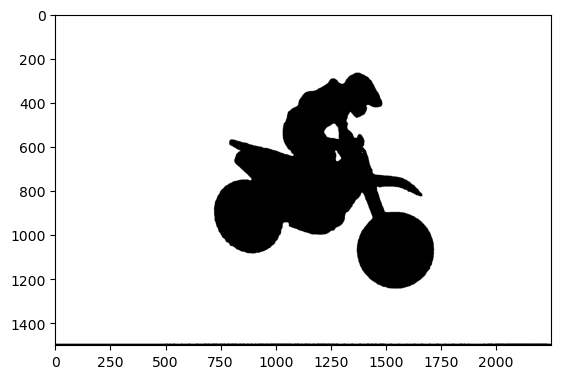

Number of masks selected: 2


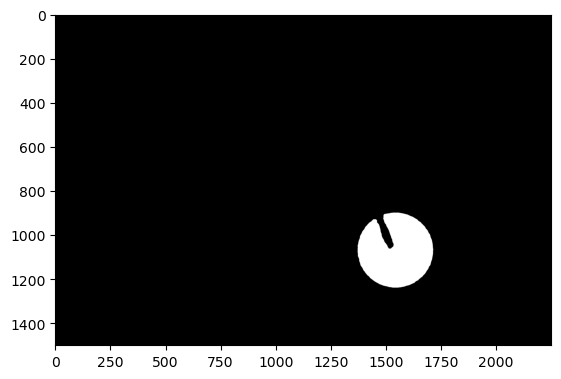

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 512, 512])
output type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1496, 2248])


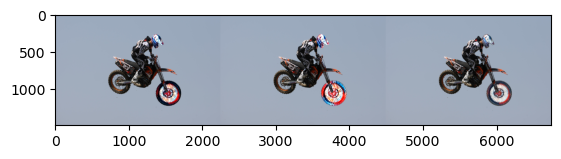

In [152]:
# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_motorcycle tire

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_224089.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...

    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/antimonocromatismo.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Ensure the output has the correct shape before converting
    print(f"output type: {type(output)}, shape: {output.shape}")

    # Convert to numpy and display
    result1 = utils.toNumpy(output1)
    result2 = utils.toNumpy(output2)
    result3 = utils.toNumpy(output3)
    
    result1 = np.clip(result1, 0, 1)
    result2 = np.clip(result2, 0, 1)
    result3 = np.clip(result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    # Blend the result with the original image
    final1 = ...
    final2 = ...
    final3 = ...
    
    final = np.hstack((final1,final2,final3))
    
    plt.imshow(final)
    plt.show()
else:
    print("No annotations found in the JSON data.")

In [153]:
plt.imsave("foreground/very small/motorcycle tire.jpg",final)

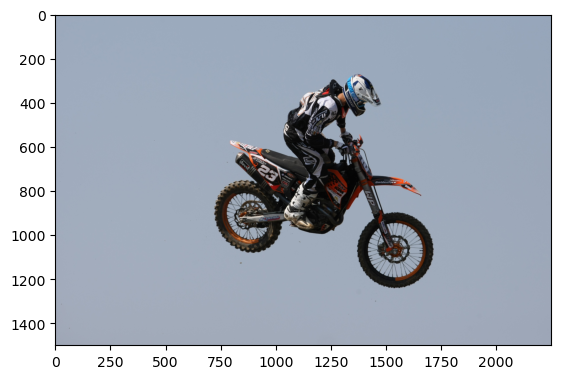

Number of annotations: 22


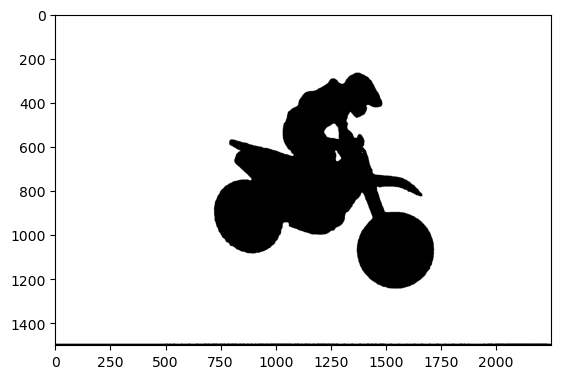

Number of masks selected: 2


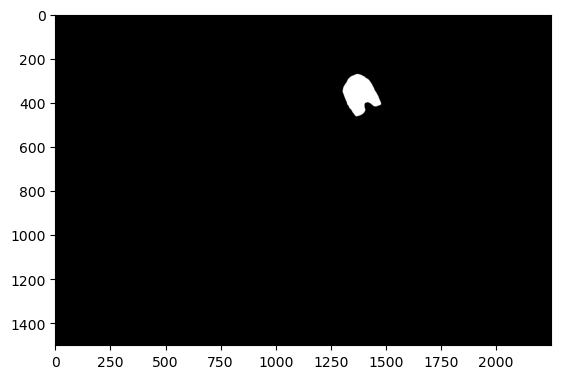

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 512, 512])
Colors [[0.60392157 0.65098039 0.7372549 ]
 [0.60784314 0.65490196 0.74117647]
 [0.60784314 0.65490196 0.74117647]
 ...
 [0.61960784 0.65490196 0.71372549]
 [0.61568627 0.65098039 0.70980392]
 [0.61568627 0.65098039 0.70980392]]
0.14717625532106343 0.08473392825252439
0.5758121748729121 0.6152743308641976 0.6746039912854037
0.6102387275108206
0.02166085013033085 0.027214578211926337 0.03512440208634938
0.026039903512745762
0.04943227000194563
-0.01149889214891416
6.051706983765589
[    89     69    153    458   2222   4714   4890   5965   8140   9084
   8658   8001   7645   7263   7077   6706   6659   6583   6721   6638
   6760   7121   7557   7728   7402   7103   6617   6122   5266   4671
   4297   3939   3541   3287   3106   2906   2744   2543   2491   2445
   2638   2506   2522   2522   2441   2344   2492   2415   2421   23

Colors [[0.00170709 0.0007825  0.00117007]
 [0.00204403 0.00130995 0.00164643]
 [0.00155291 0.00119467 0.00136555]
 ...
 [0.00051477 0.         0.00044085]
 [0.00143748 0.00047915 0.00153134]
 [0.00229764 0.00106017 0.00212059]]
0.0015265613 0.0013556334
0.0027007249 0.0019192252 0.0020357382
0.002166176
2.3303896e-06 2.660872e-06 2.5427753e-06
2.0034906e-06
4.356221074940006e-06
-1.4509877e-10
-1.5007387255714872
[43759 42655     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     0
     0     0     0     0     0     0     0     0     0     0     0     

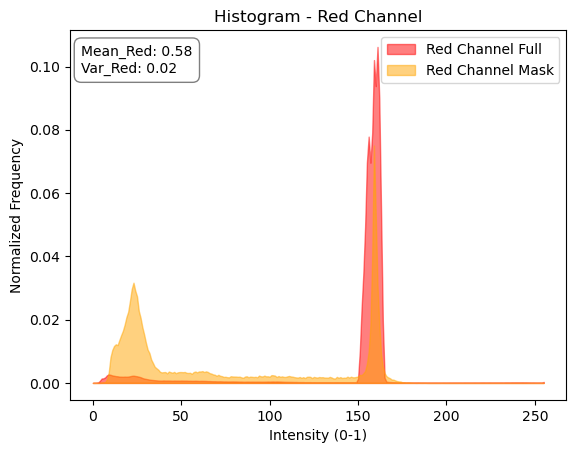

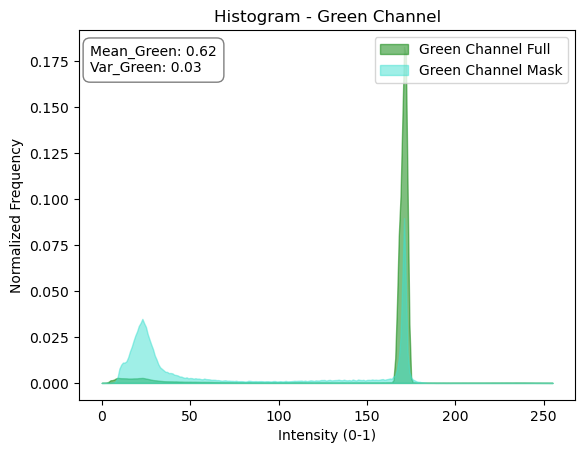

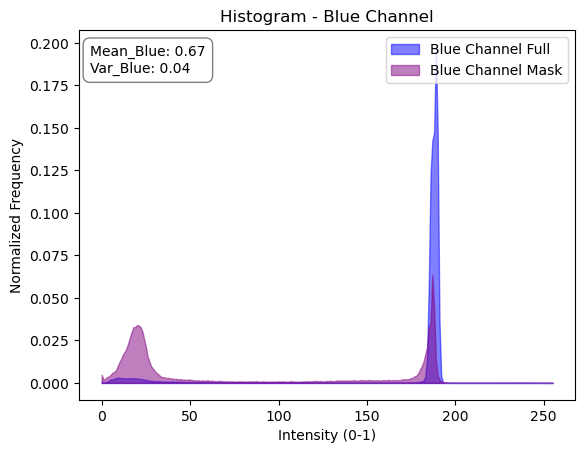

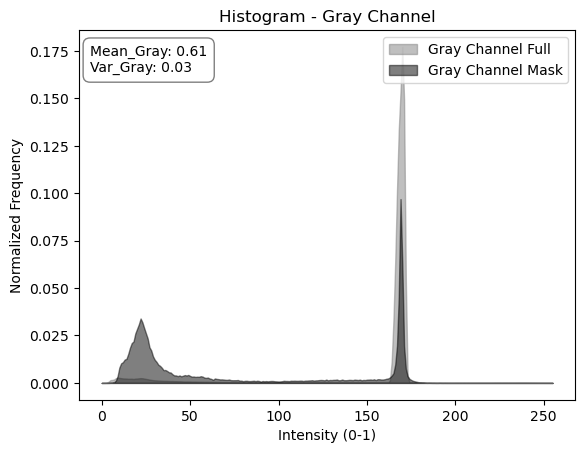

{
    "original_full": {
        "num_pixels": 3375000,
        "std_red": 0.14717625532106343,
        "L1_red": 0.08473392825252439,
        "mean_red": 0.5758121748729121,
        "mean_green": 0.6152743308641976,
        "mean_blue": 0.6746039912854037,
        "mean_gray": 0.6102387275108206,
        "var_red": 0.02166085013033085,
        "var_green": 0.027214578211926337,
        "var_blue": 0.03512440208634938,
        "var_gray": 0.026039903512745762,
        "total_var_RGB": 0.04943227000194563,
        "skewness_gray": -0.01149889214891416,
        "kurtosis_gray": 6.051706983765589,
        "hist_red": [
            89,
            69,
            153,
            458,
            2222,
            4714,
            4890,
            5965,
            8140,
            9084,
            8658,
            8001,
            7645,
            7263,
            7077,
            6706,
            6659,
            6583,
            6721,
            6638,
            6760,
    

In [115]:
# Statistics and Area graphs:

# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_chimney

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor
from utils import calcStats, saveStats

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# Load and display the image
im = plt.imread("sa_224089.jpg")
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...
    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/antimonocromatismo.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Convert to numpy and display
    style_result1 = utils.toNumpy(output1)
    style_result2 = utils.toNumpy(output2)
    style_result3 = utils.toNumpy(output3)
    
    style_result1 = np.clip(style_result1, 0, 1)
    style_result2 = np.clip(style_result2, 0, 1)
    style_result3 = np.clip(style_result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    
    data_full = calcStats(content_im, None)
    data_style = calcStats(style_im, None)
    data0 = calcStats(content_im, mask)
    data1 = calcStats(style_result1, mask, isTensor=False)
    data2 = calcStats(style_result2, mask, isTensor=False)
    data3 = calcStats(style_result3, mask, isTensor=False)

    final_data = {}
    final_data["original_full"] = data_full
    final_data["style"] = data_style
    final_data["original_mask"] = data0
    final_data["style_then_mask"] = data1
    final_data["mask_then_style"] = data2
    final_data["partialConv"] = data3

    
#     # 2. Area graph (Area graph between 0-1)

    def plot_channel_histogram(x_full, y_full, x_mask, y_mask, color_full, color_mask, mean, var, title):
        
        # Normalize the histogram by dividing by the total number of pixels
...

        # Create the area plot
        plt.fill_between(x_full, y_full, alpha=0.5, label=f'{title} Channel Full', color=color_full)
        plt.fill_between(x_mask, y_mask, alpha=0.5, label=f'{title} Channel Mask', color=color_mask)

        # Add a text box for mean and variance in the upper-left corner
        textstr = f'Mean_{title}: {mean:.2f}\nVar_{title}: {var:.2f}'
        plt.gca().text(0.022, 0.96, textstr, transform=plt.gca().transAxes, fontsize=10, 
                       verticalalignment='top', horizontalalignment='left',
                       bbox=dict(facecolor='white', alpha=0.5, boxstyle='round,pad=0.5'))

        plt.title(f"Histogram - {title} Channel")
        plt.xlabel("Intensity (0-1)")
        plt.ylabel("Normalized Frequency")
        plt.legend()
        plt.show()

    # Plot Red Channel
    plot_channel_histogram(
...
    )

    # Plot Green Channel
    plot_channel_histogram(
...
    )

    # Plot Blue Channel
    plot_channel_histogram(
...
        title="Blue"
    )

    # Plot Gray Channel
    plot_channel_histogram(
...
    )
    
    saveStats(final_data,"foreground/very small/motorcycle tire.json")

# Statistics and area graphs in one block

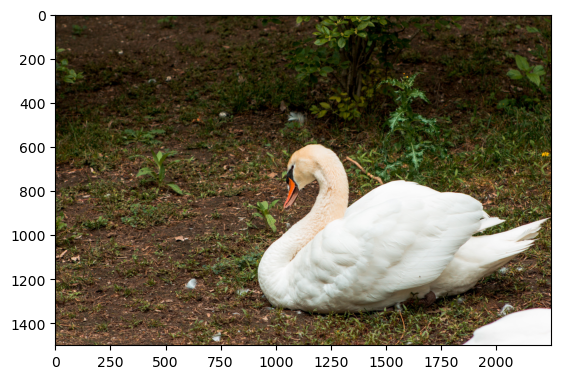

Number of annotations: 70


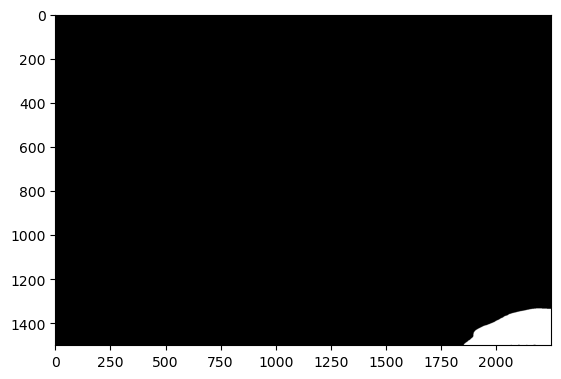

Number of masks selected: 1


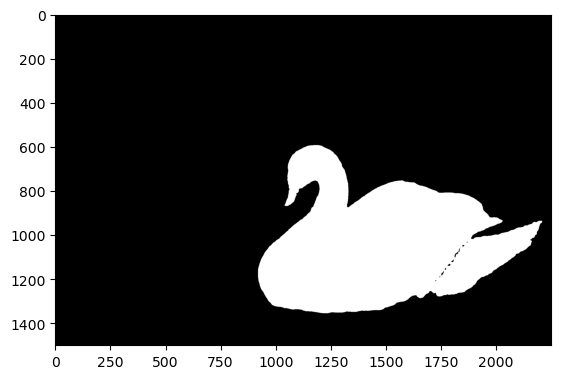

1.0
1.0
content_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 1500, 2250])
style_im type: <class 'torch.Tensor'>, shape: torch.Size([1, 3, 512, 512])
Colors [[0.21176471 0.19607843 0.05882353]
 [0.23529412 0.2        0.07058824]
 [0.2745098  0.21568627 0.09411765]
 ...
 [0.98039216 0.98039216 0.98039216]
 [0.98431373 0.98431373 0.98431373]
 [0.98431373 0.98431373 0.98431373]]
0.2672486093134494 0.2114651156304622
0.3606588525780685 0.32643317937545374 0.2336659346405227
0.3260911897632536
0.07142181917997271 0.07219937038407928 0.08233948057405803
0.07188663693069595
0.13074255389902656
0.024397467651791276
0.3894992099178425
[22550 10612  7759  8183  8157  7415  7699  7717  7975  8322  8751  9224
  9544 10170 10775 11699 12203 13154 13743 14922 15631 16495 17315 18623
 19142 20013 21449 21839 22935 23705 24636 25573 26381 26976 27637 27995
 28959 29648 29822 30642 31254 31821 31681 32899 33258 33769 34584 34337
 35110 35002 35776 35789 35484 36358 36152 36694 36724 36117 3

-0.010413827597091939
1.983349423654043
[    3     5     3     7     7     2     8     5     5    10     8    17
    14    11    18    21    16    28    31    26    32    27    24    38
    34    35    43    44    44    38    37    47    60    56    40    55
    56    71    72    71    58    66    88    71   104    99    95   111
   109   128   140   141   153   140   161   189   215   203   233   232
   228   277   284   286   335   347   335   357   383   386   383   434
   426   419   480   454   477   535   554   599   603   633   656   702
   693   728   733   774   758   810   817   898   901  1019  1044  1062
  1091  1021  1033  1035   915   934   831   839   832   749   758   749
   716   734   706   635   687   634   646   589   551   520   541   509
   541   512   577   555   588   554   585   624   615   651   635   648
   626   664   705   683   678   750   723   752   785   809   787   783
   835   886   952   879   941   931   907  1002  1013  1045  1054  1041
  1113  113

11.499207833325617
Colors [[0.00226695 0.00181058 0.00204402]
 [0.00331231 0.00290901 0.00326851]
 [0.00392157 0.00392157 0.00388918]
 ...
 [0.00199869 0.00253292 0.00306655]
 [0.00217004 0.00260232 0.00291622]
 [0.00282312 0.00294637 0.00331749]]
0.0008388356 0.0006182106
0.003466387 0.003464538 0.0033913434
0.0034567467
7.036451e-07 7.2048124e-07 8.1288846e-07
6.545092e-07
1.2942168784206476e-06
-1.085569e-09
3.730041580411055
[205629 344255      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0
      0      0      0      0      0      0      0      0      0      0

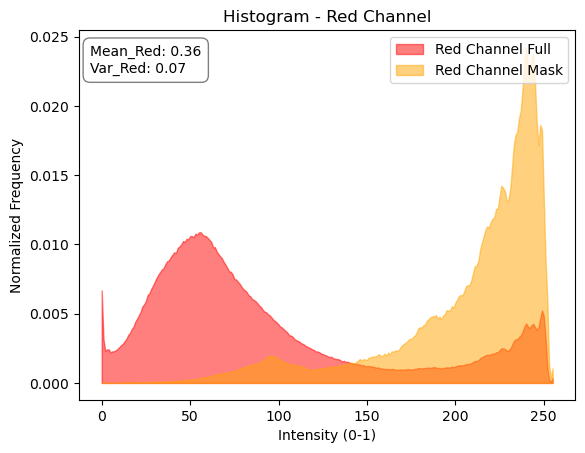

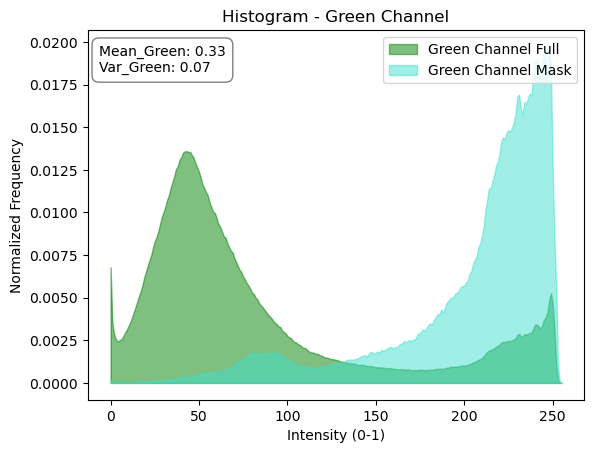

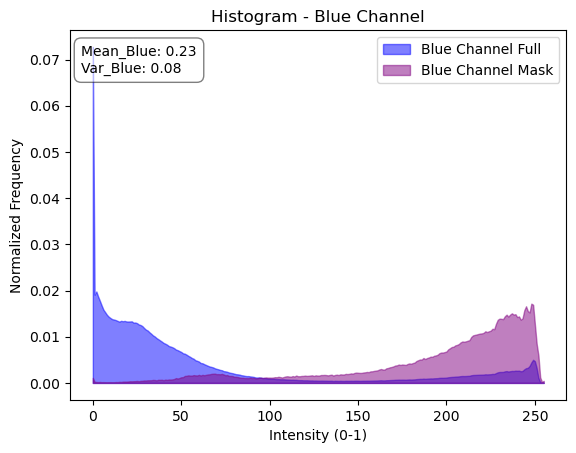

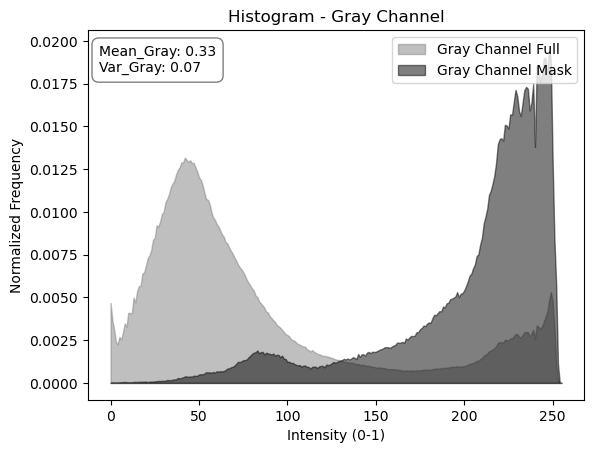

{
    "original_full": {
        "num_pixels": 3375000,
        "std_red": 0.2672486093134494,
        "L1_red": 0.2114651156304622,
        "mean_red": 0.3606588525780685,
        "mean_green": 0.32643317937545374,
        "mean_blue": 0.2336659346405227,
        "mean_gray": 0.3260911897632536,
        "var_red": 0.07142181917997271,
        "var_green": 0.07219937038407928,
        "var_blue": 0.08233948057405803,
        "var_gray": 0.07188663693069595,
        "total_var_RGB": 0.13074255389902656,
        "skewness_gray": 0.024397467651791276,
        "kurtosis_gray": 0.3894992099178425,
        "hist_red": [
            22550,
            10612,
            7759,
            8183,
            8157,
            7415,
            7699,
            7717,
            7975,
            8322,
            8751,
            9224,
            9544,
            10170,
            10775,
            11699,
            12203,
            13154,
            13743,
            14922,
         

In [8]:
# Statistics:

# Type 33: Linear Style Transfer (content, mask, style) (Regular) Mask_chimney

import torch
import utils
import numpy as np
import matplotlib.pyplot as plt
import json
import cv2
from pycocotools import mask as mask_utils
from PIL import Image
from torchvision.transforms import ToTensor
from utils import calcStats, saveStats

import importlib
importlib.reload(utils)

import styleTransfer
importlib.reload(styleTransfer)

import selectMasks
importlib.reload(selectMasks)

import generateMasks
importlib.reload(generateMasks)

# filename = "sa_235049.jpg"
# filename = "data/content/FlyingBird.jpg"
filename = "sa_224162.jpg"
# filename = "sa_224493.jpg"
# filename = "sa_224089.jpg"


file_front = filename.split(".")[0]

# save_filename = "one block/foreground/airplane.jpg"
# save_filename = "one block/foreground/FlyingBird.jpg"
save_filename = "one block/foreground/goose.jpg"
# save_filename = "one block/background/sunset.jpg"
# save_filename = "one block/foreground/motorcycle tire.jpg"

# Load and display the image
im = plt.imread(filename)
plt.imshow(im)
plt.show()

# Generate and save masks using SAM
...

# Load the saved mask JSON data
...

# Print number of annotations
if "annotations" in data:
    print(f"Number of annotations: {len(data['annotations'])}")

    # Display first mask
...

    # Select masks interactively
...

    # Print the number of masks selected
    print(f"Number of masks selected: {len(masks)}")

    # Display the first mask
...

    # Combine all masks into a single mask
...

    # Ensure combined_mask is 2D
...

    # Create an alpha channel from the combined mask
...

    # Normalize image
...
    # Prepare content and style images
    content_im = utils.imageToTensor(im)
    style_fn = "data/style/antimonocromatismo.jpg"
#     style_fn = "data/style/27.jpg"
    style_im = Image.open(style_fn).convert('RGB')
    style_im = utils.toTensor(style_im).unsqueeze(0)

    # Ensure the tensors are correct
    print(f"content_im type: {type(content_im)}, shape: {content_im.shape}")
    print(f"style_im type: {type(style_im)}, shape: {style_im.shape}")

    # Apply the combined mask to the style transfer
...
    
    #print("Shape:",mask_im.shape)
    
...

    # Convert to numpy and display
    style_result1 = utils.toNumpy(output1)
    style_result2 = utils.toNumpy(output2)
    style_result3 = utils.toNumpy(output3)
    
    style_result1 = np.clip(style_result1, 0, 1)
    style_result2 = np.clip(style_result2, 0, 1)
    style_result3 = np.clip(style_result3, 0, 1)
    #plt.imshow(result)
    #plt.show()

    
    data_full = calcStats(content_im, None)
    data_style = calcStats(style_im, None)
    data0 = calcStats(content_im, mask)
    data1 = calcStats(style_result1, mask, isTensor=False)
    data2 = calcStats(style_result2, mask, isTensor=False)
    data3 = calcStats(style_result3, mask, isTensor=False)

    final_data = {}
    final_data["original_full"] = data_full
    final_data["style"] = data_style
    final_data["original_mask"] = data0
    final_data["style_then_mask"] = data1
    final_data["mask_then_style"] = data2
    final_data["partialConv"] = data3

    
#     # 2. Area graph (Area graph between 0-1)

    def plot_channel_histogram(x_full, y_full, x_mask, y_mask, color_full, color_mask, mean, var, title):
        
        # Normalize the histogram by dividing by the total number of pixels
...

        # Create the area plot
        plt.fill_between(x_full, y_full, alpha=0.5, label=f'{title} Channel Full', color=color_full)
        plt.fill_between(x_mask, y_mask, alpha=0.5, label=f'{title} Channel Mask', color=color_mask)

        # Add a text box for mean and variance in the upper-left corner
        textstr = f'Mean_{title}: {mean:.2f}\nVar_{title}: {var:.2f}'
        plt.gca().text(0.022, 0.96, textstr, transform=plt.gca().transAxes, fontsize=10, 
                       verticalalignment='top', horizontalalignment='left',
                       bbox=dict(facecolor='white', alpha=0.5, boxstyle='round,pad=0.5'))

        plt.title(f"Histogram - {title} Channel")
        plt.xlabel("Intensity (0-1)")
        plt.ylabel("Normalized Frequency")
        plt.legend()
        plt.show()

    # Plot Red Channel
    plot_channel_histogram(
...
    )

    # Plot Green Channel
    plot_channel_histogram(
...
    )

    # Plot Blue Channel
    plot_channel_histogram(
...
        title="Blue"
    )

    # Plot Gray Channel
    plot_channel_histogram(
...
    )

    saveStats(final_data,"one block/foreground/goose.json")
    #saveStats(final_data,"one block/background/sunset.json")

# Metrics

PartialConv Better Files: 14
Same Files: 12
StyleThenMask Better Files: 10
Detected encoding for comparisons\partialconv_better\airplane.json: ascii
1.0000000591389835 1.0000000591389835 comparisons\partialconv_better\airplane.json
Detected encoding for comparisons\partialconv_better\cow.json: ascii
1.0000000591389835 0.9988102479837835 comparisons\partialconv_better\cow.json
Detected encoding for comparisons\partialconv_better\elephent.json: ascii
1.0000000591389835 1.0000000591389835 comparisons\partialconv_better\elephent.json
Detected encoding for comparisons\partialconv_better\FlyingBird.json: ascii
1.0000000591389835 1.0000000591389835 comparisons\partialconv_better\FlyingBird.json
Detected encoding for comparisons\partialconv_better\helicopter.json: ascii
1.0000000591389835 1.0000000591389835 comparisons\partialconv_better\helicopter.json
Detected encoding for comparisons\partialconv_better\horse statue.json: ascii
0.982018414651975 0.9440976369660348 comparisons\partialconv_bet

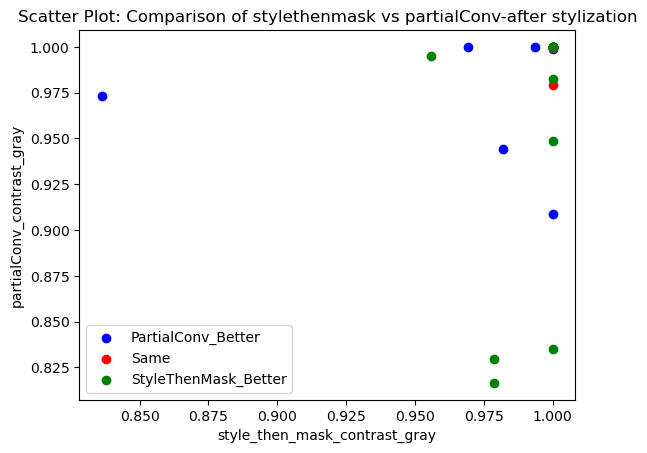

Plot saved at comparisons\predictions_plots_more images\style_then_mask_contrast_gray & partialConv_contrast_gray.jpg


In [2]:
import os
import json
import matplotlib.pyplot as plt
import chardet

# Directory paths for comparison JSON files (adjust as necessary)
comparisons_dir = "comparisons"  # Directory containing comparison JSONs
partialconv_better = os.listdir(os.path.join(comparisons_dir, "partialconv_better"))
same = os.listdir(os.path.join(comparisons_dir, "same"))
stylethenmask_better = os.listdir(os.path.join(comparisons_dir, "stylethenmask_better"))

# Print number of files in each directory
print(f"PartialConv Better Files: {len(partialconv_better)}")
print(f"Same Files: {len(same)}")
print(f"StyleThenMask Better Files: {len(stylethenmask_better)}")

# Placeholder function for loading comparison data from JSONs
def load_json_data(json_path):
    # Read the file with the detected encoding
...

    # Now open with the detected encoding
...

# Variables for storing scatter plot data
scatter_data = []

# Function for extracting combined metric from JSON
def extract_metrics(json_data):
    
    original_full = json_data.get("original_full")
    mean_red = original_full.get("mean_red")
    mean_green = original_full.get("mean_green")
    mean_blue = original_full.get("mean_blue")
    mean_gray = original_full.get("mean_gray")
    var_red = original_full.get("var_red")
    var_green = original_full.get("var_green")
    var_blue = original_full.get("var_blue")
    var_gray = original_full.get("var_gray")
    total_var_RGB = original_full.get("total_var_RGB")
    brightness_gray = original_full.get("brightness_gray")
    contrast_gray = original_full.get("contrast_gray")
    
    style = json_data.get("style")
    style_mean_red = style.get("mean_red")
    style_mean_green = style.get("mean_green")
    style_mean_blue = style.get("mean_blue")
    style_mean_gray = style.get("mean_gray")
    style_var_red = style.get("var_red")
    style_var_green = style.get("var_green")
    style_var_blue = style.get("var_blue")
    style_var_gray = style.get("var_gray")
    style_total_var_RGB = style.get("total_var_RGB")
    style_brightness_gray = style.get("brightness_gray")
    style_contrast_gray = style.get("contrast_gray")
    
    original_mask = json_data.get("original_mask")
    mask_mean_red = original_mask.get("mean_red")
    mask_mean_green = original_mask.get("mean_green")
    mask_mean_blue = original_mask.get("mean_blue")
    mask_mean_gray = original_mask.get("mean_gray")
    mask_var_red = original_mask.get("var_red")
    mask_var_green = original_mask.get("var_green")
    mask_var_blue = original_mask.get("var_blue")
    mask_var_gray = original_mask.get("var_gray")
    mask_total_var_RGB = original_mask.get("total_var_RGB")
    mask_brightness_gray = original_mask.get("brightness_gray")
    mask_contrast_gray = original_mask.get("contrast_gray")
    
    style_then_mask = json_data.get("style_then_mask")
    style_then_mask_mean_red = style_then_mask.get("mean_red")
    style_then_mask_mean_green = style_then_mask.get("mean_green")
    style_then_mask_mean_blue = style_then_mask.get("mean_blue")
    style_then_mask_mean_gray = style_then_mask.get("mean_gray")
    style_then_mask_var_red = style_then_mask.get("var_red")
    style_then_mask_var_green = style_then_mask.get("var_green")
    style_then_mask_var_blue = style_then_mask.get("var_blue")
    style_then_mask_var_gray = style_then_mask.get("var_gray")
    style_then_mask_total_var_RGB = style_then_mask.get("total_var_RGB")
    style_then_mask_brightness_gray = style_then_mask.get("brightness_gray")
    style_then_mask_contrast_gray = style_then_mask.get("contrast_gray")
    
    mask_then_style = json_data.get("mask_then_style")
    mask_then_style_mean_red = mask_then_style.get("mean_red")
    mask_then_style_mean_green = mask_then_style.get("mean_green")
    mask_then_style_mean_blue = mask_then_style.get("mean_blue")
    mask_then_style_mean_gray = mask_then_style.get("mean_gray")
    mask_then_style_var_red = mask_then_style.get("var_red")
    mask_then_style_var_green = mask_then_style.get("var_green")
    mask_then_style_var_blue = mask_then_style.get("var_blue")
    mask_then_style_var_gray = mask_then_style.get("var_gray")
    mask_then_style_total_var_RGB = mask_then_style.get("total_var_RGB")
    mask_then_style_brightness_gray = mask_then_style.get("brightness_gray")
    mask_then_style_contrast_gray = mask_then_style.get("contrast_gray")
    
    partialConv = json_data.get("partialConv")
    partialConv_mean_red = partialConv.get("mean_red")
    partialConv_mean_green = partialConv.get("mean_green")
    partialConv_mean_blue = partialConv.get("mean_blue")
    partialConv_mean_gray = partialConv.get("mean_gray")
    partialConv_var_red = partialConv.get("var_red")
    partialConv_var_green = partialConv.get("var_green")
    partialConv_var_blue = partialConv.get("var_blue")
    partialConv_var_gray = partialConv.get("var_gray")
    partialConv_total_var_RGB = partialConv.get("total_var_RGB")
    partialConv_brightness_gray = partialConv.get("brightness_gray")
    partialConv_contrast_gray = partialConv.get("contrast_gray")
    
    metric1 = style_then_mask_contrast_gray
    metric2 = partialConv_contrast_gray
    
    return 255*metric1, 255*metric2

# Gather data for different category - Load and process data from each category

# Iterate through partialconv_better
...
    
# Iterate through same
...
    
# Iterate through stylethenmask_better
...
    
# Print the number of points to plot
print(f"Total points to plot: {len(scatter_data)}")

# Scatter plot for all 36 JSON files
...
    
# Add labels and title
plt.xlabel("style_then_mask_contrast_gray")
plt.ylabel("partialConv_contrast_gray")
plt.title("Scatter Plot: Comparison of stylethenmask vs partialConv-after stylization")

# Add legend (only show unique labels)
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys())

# Save figure and Show the plot
save_path = os.path.join(comparisons_dir, "predictions_plots_more images", "style_then_mask_contrast_gray & partialConv_contrast_gray.jpg")
plt.savefig(save_path)
plt.show()

print(f"Plot saved at {save_path}")